In [198]:
from pandas_datareader import data as web
import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
import csv
from matplotlib import pyplot as plt
import random
import plotly.colors
from datetime import datetime
import time
import datetime as dt
import copy
import glob
import pickle

In [199]:
def get_data(asset_name='SPY', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019', force_yahoo=0, verbosity=0):
        
    # If the 'directory' doesn't exist, create it
    if os.path.isdir(directory) == False:
        os.mkdir(directory)

    pathname = directory + '/' + asset_name + '_' + start_date + '.csv'
    if os.path.isfile(pathname) == True and not force_yahoo:
        if verbosity >= 1:
            print('Loading from file: ', pathname)        
        df = pd.read_csv(pathname, index_col='Date')
    else:
        if verbosity >= 1:
            print('Downloading from Yahoo! - ', asset_name)
        df = web.DataReader(asset_name, data_source='yahoo', start=start_date, end=stop_date)
        df.to_csv(pathname)    

    # Copy the (date) index to a Date field and make a new index which enumerates
    # all the entries.
    df.insert(0, 'Date', df.index)
    df.index = np.arange(df.shape[0])
    df['Date']=pd.to_datetime(df['Date'], format='%Y/%m/%d')
    
    return df 

In [200]:
# Synthetic stock generator

# We'll generate the Adj Close price as the primary (since this is the sequnce of labels we are training on)
# The relationship of the other features to the Adj Close will be as follows:
# Close = close_scale * Adj Close
# Open = previous day's Close
# Low = Open
# High = Close
# Volume = 0

# source_asset_name - name of asset to model from
# trend_list - list of tuples - (magnitude, days for a full cycle of this trend)

def make_synthetic_stock(source_asset_name='SPY', new_name='SYN', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019', trend_list=[], adj_close_start=0, price_slope=0, close_scale=1.4):
    
    syn_df = get_data(asset_name=source_asset_name, directory=directory, start_date=start_date, stop_date=stop_date, force_yahoo=1)
        
    syn_length = len(syn_df)
    
    for i in range(syn_length):
        mag = adj_close_start + (i * price_slope)
        for trend in trend_list:
            mag += (trend[0] * np.sin(6.28 * i / trend[1]))

        syn_df['Adj Close'].loc[i] = mag
        syn_df['Close'].loc[i] = mag * close_scale
    
        # Today's open is yesterday's close
        if i > 0:
            syn_df['Open'].loc[i] = syn_df['Close'].loc[i-1]
        else:
            syn_df['Open'].loc[i] = syn_df['Close'].loc[i]
        
        syn_df['Low'].loc[i] = syn_df['Open'].loc[i]
        syn_df['High'].loc[i] = syn_df['Close'].loc[i]
    
    pathname = directory + '/' + new_name + '_' + start_date + '.csv'    
    
    syn_df.to_csv(pathname, index=False)    

    

In [201]:
# Display a Plotly interactive candelstick chart

# path is directory to save image in
# display_plot - 1=display plot in Notebook

def plotly_candlestick(asset_df, asset_name, basefn = '', display_plot = 0, save_plot=1):

    df = asset_df
    
    trace1 = {
        'x': df.Date,
        'open': df.Open,
        'close': df.Close,
        'high': df.High,
        'low': df.Low,
        'type': 'candlestick',
        'name': asset_name,
        'showlegend': True
    }

    data = [trace1]
        
    layout = go.Layout({
        'title': {
            'text': 'Asset: ' + asset_name,
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(trace1, layout)
    
    if display_plot:        
        fig.show()
    
    if save_plot:
        fig.write_html(basefn + 'asset_candelstick.html')



In [202]:
def add_features_to_df(df):
    # Add a feature called Prev Adj CLose
    prev_adj_close = df['Adj Close'].shift(1).copy()
    df['Prev Adj Close'] = prev_adj_close

    # Take care of special case of very first previous Adj close - just make is the same as the Adj Close
    df['Prev Adj Close'][0] = df['Prev Adj Close'][1]
    
    # Volume isn't used
    df = df.drop(columns=['Volume'])
    
    return df
    

In [230]:
# torch.cuda.is_available() checks and returns a Boolean True if a GPU is available, else it'll return False
is_cuda = torch.cuda.is_available()

print("Cuda available:",torch.cuda.is_available())

# If we have a GPU available, we'll set our device to GPU. We'll use this device variable later in our code.
if is_cuda:
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
    


Cuda available: True


In [204]:
# This will normalise each column of a dataframe to +/- 0.5

def normalise_df(df):
           
    r = df.copy()
    
    # Get the min and max of all values in dataframe except 'Date' field
    min_value = df.drop('Date',1).min().min()    
    max_value = df.drop('Date',1).max().max()

#    print(min_value)
#    print(max_value)
    
#    r['Open'] = (r['Open'] - min_value) / (max_value - min_value) - 0.5
#    r['Low'] = (r['Low'] - min_value) / (max_value - min_value) - 0.5
#    r['High'] = (r['High'] - min_value) / (max_value - min_value) - 0.5
#    r['Close'] = (r['Close'] - min_value) / (max_value - min_value) - 0.5
#    r['Adj Close'] = (r['Adj Close'] - min_value) / (max_value - min_value) - 0.5
#    r['Prev Adj Close'] = (r['Prev Adj Close'] - min_value) / (max_value - min_value) - 0.5    


    r.loc[:, r.columns != 'Date'] = (((r.loc[:, r.columns != 'Date'] - min_value) / (max_value - min_value)) - 0.5)
#    print(r.describe())
    
#    display(r)
    scale = max_value - min_value
    offset = min_value
#    To un-normalise:
    
#    original_value = ((norm_price + 0.5) * scale) + offset
#    scale = max_value - min_value
#    offset = min_value

#    print("values from df normalisation:")
#    print("Scale:", scale)
#    print("Offset:", offset)


#    display(r.head())
#    display(df.head())
    return r, scale, offset

In [205]:
def denormalise_value(norm_value, scale, offset):
    return (((norm_value + 0.5) * scale) + offset)

In [206]:
def unnormalise_df(df, scale, offset):
    
    result = df.copy()
    
    df = ((df + 0.5) * scale) + offset
    
    return(df)

In [207]:
# This version is for sequence to value learning - the label is a single value - tomorrow's Adj Close

# Given one of the asset train, valid or test dataframes, this will make a new three dimensional list which has
# dimensions (num_samples, window_size - tw, 6) which represents the effect of sliding a window of width window_size (tw)
# down the dataframe from start to end and collecting the input features into a length 6 vector.  This will be our
# input dataset to the LSTM.

# In addition, also generate a list of (training) labels which is "tomorrow's" adjusted closing price - the thing 
# we are trying to predict. There is a single training label for each tw x 6 set of inputs.


def create_input_sequences_out_val_from_df(input_data_df, tw):
    in_seq = []
    out_seq= []
    L = len(input_data_df)

    for i in range(L-tw):
        seq = []
        for j in range(tw):
            features = [input_data_df['Open'].loc[i+j], input_data_df['Low'].loc[i+j], input_data_df['High'].loc[i+j], 
                        input_data_df['Close'].loc[i+j], 
                         input_data_df['Prev Adj Close'].loc[i+j], input_data_df['Adj Close'].loc[i+j]]
            seq.append(features)

        train_label = input_data_df['Adj Close'].loc[i+tw]
        out_seq.append(train_label)
        in_seq.append(seq)
    return in_seq, out_seq


In [208]:
# This version is for sequence to sequence learning - the label is a sequence up to and including tomorrows Adj Close

def create_input_sequences_from_df(input_data_df, tw):
    in_seq = []
    out_seq= []
    L = len(input_data_df)

    for i in range(L-tw):
        window_input_seq = []
        window_output_seq = []
        for j in range(tw):
            features = [input_data_df['Open'].loc[i+j], input_data_df['Low'].loc[i+j], input_data_df['High'].loc[i+j], 
                        input_data_df['Close'].loc[i+j], 
                         input_data_df['Prev Adj Close'].loc[i+j], input_data_df['Adj Close'].loc[i+j]]
            window_input_seq.append(features)
            
            window_output_seq.append(input_data_df['Adj Close'].loc[i+j+1])

        out_seq.append(window_output_seq)
        in_seq.append(window_input_seq)
        
#        print("seq:", i)
#        print("input:\n",window_input_seq)
#        print("output:\n", window_output_seq)
    return in_seq, out_seq


In [209]:
def get_continuous_color(colorscale, intermed):
    """
    Plotly continuous colorscales assign colors to the range [0, 1]. This function computes the intermediate
    color for any value in that range.

    Plotly doesn't make the colorscales directly accessible in a common format.
    Some are ready to use:
    
        colorscale = plotly.colors.PLOTLY_SCALES["Greens"]

    Others are just swatches that need to be constructed into a colorscale:

        viridis_colors, scale = plotly.colors.convert_colors_to_same_type(plotly.colors.sequential.Viridis)
        colorscale = plotly.colors.make_colorscale(viridis_colors, scale=scale)

    :param colorscale: A plotly continuous colorscale defined with RGB string colors.
    :param intermed: value in the range [0, 1]
    :return: color in rgb string format
    :rtype: str
    """
    if len(colorscale) < 1:
        raise ValueError("colorscale must have at least one color")

    if intermed <= 0 or len(colorscale) == 1:
        return colorscale[0][1]
    if intermed >= 1:
        return colorscale[-1][1]

    for cutoff, color in colorscale:
        if intermed >= cutoff:
            low_cutoff, low_color = cutoff, color
        else:
            high_cutoff, high_color = cutoff, color
            break

    # noinspection PyUnboundLocalVariable
    return plotly.colors.find_intermediate_color(
        lowcolor=low_color, highcolor=high_color,
        intermed=((intermed - low_cutoff) / (high_cutoff - low_cutoff)),
        colortype="rgb")

In [210]:
def plotly_gradients(model, min_grads, max_grads, ave_grads, basefn='', display_plot=0, save_plot=1):
    
    scale = plotly.colors.PLOTLY_SCALES["Bluered"]

    print("Number of gradients randomly sampled:", len(ave_grads))  
    
    
    # Assemble the names of the layers
    layers = []
    for n,p in model.named_parameters():
        if (p.requires_grad) and ("bias" not in n):
            layers.append(n)
    
    # Dong this the dumb way just now
    max_array = np.zeros(len(layers))
    min_array = np.ones(len(layers))
    mean_array = np.zeros(len(layers))
    
    for i in range(len(min_grads)):
        for j in range(len(layers)):
            if max_grads[i][j].item() > max_array[j]:
                max_array[j] = max_grads[i][j].item()
            
            mean_array[j] += ave_grads[i][j].item()
            
            if min_grads[i][j].item() < min_array[j]:
                min_array[j] = min_grads[i][j].item()
                   
    mean_array /= len(min_grads)
    
    print(len(layers))
    print(len(min_grads))
    print(len(max_grads))
    print(len(ave_grads))    

    print(min_array)
    print(mean_array)
    print(max_array)
    
    fig = go.Figure()
    df = pd.DataFrame(
#        {'mean': [0.1,0.4,0.5,0.6,0.7,0.8,0.9],
#        'max': [0.3,0.5,0.6,0.9,1.1,1.3,1.6],
#        'min': [0.0,0.2,0.4,0.3,0.5,0.2,0.3],
        {'mean': mean_array,
        'max': max_array,
        'min': min_array,         
        'labels': layers})

    fig.add_trace(go.Scatter(x=df['labels'], y=df['min'],
        fill=None,
        mode='lines',
        line_color=get_continuous_color(scale, 0),
        name="Min",
        line={'width': 4},
        legendgroup="group1"
        ))
    fig.add_trace(go.Scatter(
        x=df['labels'],
        y=df['mean'],
        legendgroup="group2",
        fill='tonexty',
        fillcolor=get_continuous_color(scale, 0.25).replace('rgb','rgba').replace(')',',0.5)'),
        line_color=get_continuous_color(scale, 0.25),
        mode='lines', name="Bottom Half"))
    fig.add_trace(go.Scatter(x=df['labels'], y=df['mean'],
        fill=None,
        mode='lines',
        legendgroup="group1",
        line={'width': 4},
        line_color=get_continuous_color(scale, 0.5),
        name="Mean"))
    fig.add_trace(go.Scatter(
        x=df['labels'],
        y=df['max'],
        legendgroup="group2",
        fill='tonexty',
        fillcolor=get_continuous_color(scale, 0.75).replace('rgb','rgba').replace(')',',0.5)'),
        line_color=get_continuous_color(scale, 0.75),
        mode='lines',
        name="Top Half"))
    fig.add_trace(go.Scatter(x=df['labels'], y=df['max'],
        fill=None,
        mode='lines',
        legendgroup="group1",
        line={'width': 4},
        line_color=get_continuous_color(scale, 1),
        name="Max"
        ))

    if display_plot:
        fig.show()
        
    if save_plot:
        fig.write_html(basefn + 'gradients.html')
    


In [211]:
# train_loss and val_loss are lists containing the loss per step


def plot_losses(train_loss, val_loss, title='Train / Validation Loss', basefn='', display_plot=0, save_plot=1):

    iter = len(train_loss)
    
    # Plot the training / validation loss vs step
    trace1 = {
        'x': np.arange(0,len(train_loss)),
        'y': np.array(train_loss),
                  
        'type': 'scatter',
        'name': 'Training',
        'showlegend': True
    }

    trace2 = {
        'x': np.arange(0,len(val_loss)),
        'y': np.array(val_loss),
                  
        'type': 'scatter',
        'name': 'Validation',
        'showlegend': True
    }

    data = [trace1, trace2]
        
    layout = go.Layout({
        'title': {
            'text': title,
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)
    
    if display_plot:
        fig.show()
        
    if save_plot:
        fig.write_html(basefn + 'Train_losses.html')
    



In [212]:
def plot_returns_hist(predicted_returns, actual_returns, title='Histogram: Predicted vs Actual Returns', basefn='', display_plot=0, save_plot=1):

    fig = go.Figure()
    fig.add_trace(go.Histogram(x=predicted_returns, name='Predicted'))
    fig.add_trace(go.Histogram(x=actual_returns, name='Actual'))
    fig.update_layout(
        title_text = title,
        xaxis_title_text = 'Return',
        yaxis_title_text = 'Count'
    )
    
    if display_plot:
        fig.show()
    
    if save_plot:
        fig.write_html(basefn + 'Returns_hist.html')

In [213]:
def plot_hidden(h, basefn='', display_plot=0, save_plot=1):
    
    # h is a tuple containing 2 tensors (one for h, one for c). 
    # Each tensor is of dimension [num layers, batch size, hidden size]
    # e.g. [3, 1, 128]
        
    titles = ['Hidden State', 'Cell State']
    
    x = np.arange(0, h[0].size()[2])
        
    # Loop through hidden and cell states
    for state in range(2):
        data = []
        # Loop through each layer, add a trace for each
        for layer in range(h[state].size()[0]):
            h_tensor = h[state][layer][0].cpu()
            trace = {
                'x': x,                
                'y': np.array(h_tensor.detach().numpy()),
                  
                'type': 'scatter',
                'name': 'Layer '+str(layer),
                'showlegend': True
                }
            data.append(trace)
        
        layout = go.Layout({
            'title': {
                'text': titles[state],
                'font': {
                    'size': 20
                }
            }
        })

        fig = go.Figure(data, layout)
        
        if display_plot:
            fig.show()
        
        if save_plot:
            fig.write_html(basefn + 'Train_hidden_layer_snapshot.html')


In [214]:
def plot_lstm_output(lstm_output, basefn='', display_plot=0, save_plot=1):
    
    # lstm_output is a tuple containing [sequence length] number of tensors.
    # Each tensor is the lstm output with dimensions [batch size, hidden size]
    # e.g. [1, 128]
    
    x = np.arange(0, lstm_output.size()[1])
        
    data = []
    
    # Loop through each layer, add a trace for each
    for i in range(len(lstm_output)):
        lstm_tensor = lstm_output[i].cpu()
        trace = {
            'x': x,
            'y': np.array(lstm_tensor.detach().numpy()),
                  
            'type': 'scatter',
            'name': 'Cell '+str(i),
            'showlegend': True
            }
        data.append(trace)
        
    layout = go.Layout({
        'title': {
            'text': 'LSTM Output',
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)
    
    if display_plot:
        fig.show()   
        
    if save_plot:
        fig.write_html(basefn + 'Train_LSTM_output_snapshot.html')
    

In [215]:
def plot_weights(model, basefn='', display_plot=0, save_plot=1):
    
    # Plot the linear weights - just a simple line chart
    linear_tensor = model.linear.weight[0].cpu()
    x = np.arange(0, len(model.linear.weight[0]))
    y = np.array(linear_tensor.detach().numpy())
  
    # Plot the training / validation loss vs step
    trace1 = {
        'x': x,
        'y': y,
                  
        'type': 'scatter',
        'name': 'Linear Weights',
        'showlegend': True
    }

    data = [trace1]
        
    layout = go.Layout({
        'title': {
            'text': 'Linear Weights',
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)
    
    if display_plot:
        fig.show()
        
    if save_plot:
        fig.write_html(basefn + 'Train_linear_weights.html')
    
    ave_weights = []
    max_weights = []
    layers = []
    for n,p in model.named_parameters():
        if (p.requires_grad) and ("bias" not in n) and ("linear" not in n):
            layers.append(n)
            ave_weights.append(p.abs().mean().item())
            max_weights.append(p.abs().max().item())

    trace1 = {
        'x' : layers,
        'y' : ave_weights,
        'type' : 'bar'
    }    

    data = [trace1]
    layout = go.Layout({
        'title': {
            'text': 'Average of LSTM Weights',
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)

    if display_plot:
        fig.show()
        
    if save_plot:
        fig.write_html(basefn + 'Train_ave_lstm_weights.html')
    
    
    trace1 = {
        'x' : layers,
        'y' : max_weights,
        'type' : 'bar'
    }    

    data = [trace1]
    layout = go.Layout({
        'title': {
            'text': 'MAX of LSTM Weights',
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)
    
    if display_plot:
        fig.show()
        
    if save_plot:
        fig.write_html(basefn + 'Train_max_lstm_weights.html')
        
    

In [216]:
def gradient_plot(layer_names, grads, color, title, basefn='', display_plot=0, save_plot=1):
       
    for i in range(len(grads)):
        plt.plot(grads[i], alpha=0.3, color=color)
    
    plt.hlines(0, 0, len(grads)+1, linewidth=1, color="k")
    plt.xticks(range(0,len(grads[0]),1), layer_names, rotation="vertical")
    plt.xlim(xmin=0, xmax=len(grads[0]))
    
    plt.xlabel("Layers")
    plt.ylabel("Gradient")
    plt.title(title)
    plt.grid(True)
           
    # This has to go before the plt.show() otherwise it's blank
    if save_plot:
        plt.savefig(basefn + title + '.png', bbox_inches='tight')

    if display_plot:
        plt.show()


In [217]:
def plot_gradients(model, ave_grads, max_grads, basefn='', display_plot=0, save_plot=1):

    print("Number of gradients randomly sampled:", len(ave_grads))    
    
    # Assemble the names of the layers
    layers = []
    for n,p in model.named_parameters():
        if (p.requires_grad) and ("bias" not in n):
            layers.append(n)

    gradient_plot(layers, ave_grads, 'b', 'Gradient Flow - All Layers - Average', basefn=basefn, display_plot=display_plot, save_plot=save_plot)
    gradient_plot(layers, max_grads, 'r', 'Gradient Flow - All Layers - Max', basefn=basefn, display_plot=display_plot, save_plot=save_plot)
        
    ave_grads_lstm = [sublist[:len(layers)-1] for sublist in ave_grads]
    max_grads_lstm = [sublist[:len(layers)-1] for sublist in max_grads]
    layers_lstm = layers[0:len(layers)-1]
    
    gradient_plot(layers_lstm, ave_grads_lstm, 'b', 'Gradient Flow - LSTM Layers - Average', basefn=basefn, display_plot=display_plot, save_plot=save_plot)
    gradient_plot(layers_lstm, max_grads_lstm, 'r', 'Gradient Flow - LSTM Layers - Max', basefn=basefn, display_plot=display_plot, save_plot=save_plot)
 


In [218]:

class NeilLSTM(nn.Module):
    def __init__(self, input_size = 6, window_size = 11, arch = 'LH', hidden_size = 64, output_size = 1, num_layers = 3, dropout=0.5):
        super().__init__()
        
        # Store some stuff we need to know in the forward pass
        self.n_layers = num_layers        
        self.hidden_layer_size = hidden_size
        self.arch = arch

        # Define the LSTM layer
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, 
                            batch_first=False, bias=True, dropout=dropout, bidirectional=False)
                
        # Define the linear layer
        # Perhaps should perform forward on the lstm to explicitly get the size of the 
        # tensor for sequence to one vs sequence to sequence versions.
        
        # The size of the linear layer for LH or AH model
        if arch == 'LH':
            self.linear = nn.Linear(hidden_size, output_size, bias = True)
        elif arch == 'AH':
            self.linear = nn.Linear(hidden_size * window_size, output_size, bias = True)
        
        torch.nn.init.xavier_uniform_(self.linear.weight)
        
        # NEED TO FIX THIS STUPID HARD CODED INIT
        if num_layers >= 1:
            torch.nn.init.xavier_uniform_(self.lstm.weight_hh_l0)
            torch.nn.init.xavier_uniform_(self.lstm.weight_ih_l0)
            
        if num_layers >= 2:
            torch.nn.init.xavier_uniform_(self.lstm.weight_hh_l1)        
            torch.nn.init.xavier_uniform_(self.lstm.weight_ih_l1)                    
        
        if num_layers >= 3:
            torch.nn.init.xavier_uniform_(self.lstm.weight_hh_l2)                        
            torch.nn.init.xavier_uniform_(self.lstm.weight_ih_l2)                        
        
        
    # Forward pass
    # input_seq shape is: (sequence length, num input features) - there's no batch dimension
    def forward(self, input_seq, hidden, verbose=0):

        if verbose:
            print("\n\nlstm input:\n", input_seq)
            print("\n\nlstm input view:\n", input_seq.view( len(input_seq) , 1 , -1))
            print("\n\nlstm hidden input:\n", hidden)
            
        lstm_out, hidden = self.lstm( input_seq.view( len(input_seq) , 1 , -1), hidden)
        
        if verbose:
            print("\n\nlstm_output:\n", lstm_out)
            print("\n\nhidden output:\n", hidden)
                    
        # Feed forward the outputs of the lstm into the linear layer       
        # lstm_out dims are (seq_len, batch, hidden dim)
        # This is converted to (seq_len, hidden_dim) before input to the linear layer        
        # When T=22 and hidden_layer_size=64, the shape of the lstm_out tensor is [22,1,64]    
        # This view reshapes it to [22, 64]
        lstm_out_view = lstm_out.view(len(input_seq), -1)
        
        if verbose:
            print("\n\nlstm_out_view:\n", lstm_out_view)
                                       
        if verbose:
            print("\n\nLinear weights:\n", self.linear.weight)
            print("\n\ninput to fc:\n", lstm_out_view[-1])
        
        # LH - Just present the last hidden state to the linear network            
        if self.arch == 'LH':
            predictions = self.linear(lstm_out_view[-1])
        # AH - flatten and present all to linear network
        elif self.arch == 'AH':
            predictions = self.linear(torch.flatten(lstm_out_view))
        
        if verbose:
            print("\n\npredictions:\n",predictions)
        
        # predictions has dimension: (1, seq_len)        
        return predictions, hidden, lstm_out_view
    
    
    def init_hidden(self, batch_size = 1):
        weight = next(self.parameters()).data
        hidden = (weight.new(self.n_layers, batch_size, self.hidden_layer_size).zero_().to(device),
                 weight.new(self.n_layers, batch_size, self.hidden_layer_size).zero_().to(device))
        return(hidden)
        

In [219]:
# Trains the given LSTM model. Also collects validation data (predicting the next day) and collects stats
# for both.  These are used to observe training vs validation but also to construct the first allocation policy.

# Q version has removed inner loop instrumentation and made other spped changes
# This version runs about 20% faster than the non-Q version

def train_modelQ(model, train_seq, train_labels, scale=1, offset=1, train_start=0, train_length=1, epochs = 20, iter_per_seq=1, max_iter=1600, lr = 0.001, dr=0.999, wd=0.0, verbosity=0, basefn='',percentiles=[0,10,20,30,40,50,60], trading_validation_period=100, valid_seq=[], valid_labels=[], plot=0):
    input_size = 6
    
    
    # if plot level is 4, plot graphs on screen for every inner loop training run
    if plot == 4:
        dump_log_interval = 1
    else:
        dump_log_interval = 10 # otherwise do it every 10
        
    loss_function = nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay = wd)
    my_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer = optimizer, gamma = dr)
    
    batch_size = 1  # batch mode isn't used actually but including for future possible use
    
    with open(basefn + 'train.csv', 'a', newline='') as myfile:
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(['Epc','AvTrLoss','AvTrMSE','AvValMSE','MdnTrMSE','MdnValMSE','ValMDA','ValMAPE','ValMAE','PXcorr','RXcorr',
                     'EpcSecs','TtlMins'])
        
    with open(basefn + 'trade_validation.csv', 'w', newline='') as myfile:
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(['Epoch','MDA','MSE','MAE','MAPE','X-Correl','Num-trades','AveRt%','MdnRT%','MinRt%','MaxRt%',
                    'RangeRt%','StdDevRt%'])
            
    # Outputs a summary line for each Epoch
    if verbosity == 1:
        print('Epc  AvTrLoss  AvTrMSE   AvValMSE  MdnTrMSE  MdnValMSE  ValMDA    ValMAPE  ValMAE    PXcorr  RXcorr Secs    TTlMins')

    # Outputs a summary line for each sequence in each epoch
    if verbosity == 2:
        print('EPc  Seq#   TrLoss    TrMSE     PredR   ActRt   ValLoss   VAdjC    VPred   VAct      VPredRt   VActRt   RunMDA')            
                            
    
#    train_losses = []
#    val_adj_close_price = []
    ave_grads = []
    max_grads = []
    min_grads = []
    
    # If the number of epochs is high, just sample the gradients stochastically to avoid retaining too much
    # data.
    if (epochs * train_length) > 1000:
        sample_grads = 1000.0 / (epochs * train_length)
    else:
        sample_grads = 1.0

    start_time = time.time()       
    
    train_seq_cuda = train_seq.to(device)
    train_labels_cuda = train_labels.to(device)

    # How many times through the entire training set
    for i in range(epochs):
        train_losses = []
        val_adj_close_price = []        
        train_mses = []
        val_mses = []
        val_pred_rt = []
        val_act_rt = []
        val_pred_price = []
        val_act_price = []        
        running_mda = 0
        epoch_start_time = time.time()
        
        model.train()
        
        # Each sample in the training set
        for j in range(train_start, train_start + train_length):      
                        
            inputs = train_seq_cuda[j]
            labels = train_labels_cuda[j]
            
            # How many times we train on each sample as we go
            for iter in range(iter_per_seq):
                # Initialise hidden states before every training event
                h = model.init_hidden(batch_size)  
                                    
                optimizer.zero_grad()
        
                y_pred, h, lstm_out = model(inputs, h)
            
                # y_pred and labels are both size T - sequence to sequence loss function
                train_loss = loss_function(y_pred, labels)
            
                # Compute gradients and update the model
                train_loss.backward()
                                
                optimizer.step()
                
            # For speed, we only do outer loop validation at the same time we do trading validation (the stats are
            # needed to compute the initial allocation policy)
            
            if i % trading_validation_period == 0:
                # Sample stochastically the last set of gradients after the inner loop for plotting later
                if plot and (random.random() < sample_grads):
                    ave_grad=[]
                    max_grad=[]
                    min_grad=[]
                    for n,p in model.named_parameters():
                        if (p.requires_grad) and ("bias" not in n):
                            ave_grad.append(p.grad.abs().mean())
                            max_grad.append(p.grad.abs().max())
                            min_grad.append(p.grad.abs().min())
                    ave_grads.append(ave_grad)
                    max_grads.append(max_grad)
                    min_grads.append(min_grad)            
            
                # Capture the (snapshot) metrics from the last inner loop cycle
                training_loss = train_loss.item()  # This is the sequence to sequence training loss                        
                train_adj_close = inputs[-1][-1].item()   # Adj close at t=0
                train_pred = y_pred[-1].item()  # Next day predicted Adj close
                train_truth = labels[-1].item()  # Next day actual Adj close
                train_mse = (train_pred - train_truth)**2   # MSE of just the predicted value vs truth
                train_predicted_return = (denormalise_value(train_pred, scale, offset) / denormalise_value(train_adj_close, scale, offset)) - 1            
                train_actual_return = (denormalise_value(train_truth, scale, offset) / denormalise_value(train_adj_close, scale, offset)) - 1

                # Outer loop validation every trading_validation_period epochs
                model.eval()
            
                inputs = train_seq[j+1].to(device)
                labels = train_labels[j+1].to(device)
            
                with torch.no_grad():
                    h = model.init_hidden(batch_size)
        
                    y_pred, h, lstm_out = model(inputs, h)
                    
                    valid_adj_close = inputs[-1][-1].item()                
                    valid_pred = y_pred[-1].item()
                    valid_truth = labels[-1].item()
                    valid_loss = (valid_pred - valid_truth)**2  # Just the mse of the valid predicted value vs truth
            
                    valid_predicted_return = (denormalise_value(valid_pred, scale, offset) / denormalise_value(valid_adj_close, scale, offset)) - 1
                    valid_actual_return = (denormalise_value(valid_truth, scale, offset) / denormalise_value(valid_adj_close, scale, offset)) - 1

                    if (valid_predicted_return * valid_actual_return >= 0):
                        running_mda += 1                
                
                    # If enabled, print results line at the end of inner loop training on each sequence
                    if (verbosity==2):
                        print('{:4}'.format(i),
                            '{:4}'.format(j), 
                          '  {:1.1e}'.format(training_loss),
                          '  {:1.1e}'.format(train_mse),
                          ' {: 2.3f}'.format(100.0*train_predicted_return), 
                          ' {: 2.3f}'.format(100.0*train_actual_return),
                          '  {:1.1e}'.format(valid_loss), 
                          ' {: 1.4f}'.format(valid_adj_close), 
                          ' {: 1.4f}'.format(valid_pred), 
                          ' {: 1.4f}'.format(valid_truth),
                          ' {: 2.4f}'.format(100.0*valid_predicted_return), 
                          ' {: 2.4f}'.format(100.0*valid_actual_return),
                          '  {:2.2f}'.format(100.0*running_mda/(j+1)))
                    
                    # Keep lists of the results of train / validation for each sequence for passing back up the stack
                    train_losses.append(training_loss)
                    train_mses.append(train_mse)
                    val_mses.append(valid_loss)
                    val_pred_rt.append(valid_predicted_return)
                    val_act_rt.append(valid_actual_return)
                    val_pred_price.append(valid_pred)
                    val_act_price.append(valid_truth)
                    val_adj_close_price.append(valid_adj_close)
                    
                model.train()
                
            # End of outer loop
            
        my_lr_scheduler.step()            
           
        elapsed_secs = time.time()-start_time
        print(i, time.time()-epoch_start_time, elapsed_secs, optimizer.param_groups[0]['lr'])
        
        if i % trading_validation_period == 0:
            # We report stats on the last portion of the training
            stats_len = int(0.5 * len(train_losses))
            
            metrics_dict = compute_metrics(np.array(val_pred_rt[-stats_len:]),
                                   np.array(val_act_rt[-stats_len:]),
                                   np.array(val_pred_price[-stats_len:]),
                                   np.array(val_act_price[-stats_len:]))

            # This is the results we'll pass back up the stack for the entire training
            result_dict = {'trStats_N':stats_len, 'AvTrLoss':np.mean(train_losses[-stats_len:]),
                   'trAvTrMSE':np.mean(train_mses[-stats_len:]),
                   'trAvValMSE':np.mean(val_mses[-stats_len:]),
                   'trMdnTrMSE':np.median(train_mses[-stats_len:]),
                   'trMdnValMSE':np.median(val_mses[-stats_len:]),
                   'train_mses':train_mses, 'valid_mses':val_mses, 'val_pred_rt':val_pred_rt, 'val_act_rt':val_act_rt, 
                   'val_pred_price':val_pred_price, 'val_act_price':val_act_price, 
                   'val_adj_close_price': val_adj_close_price,
                    'trMDA': metrics_dict['MDA'],
                    'trMAPE': metrics_dict['MAPE'],
                    'trMAE': metrics_dict['MAE'],
                    'trPXCORR': metrics_dict['PXCORR'],
                    'trRXCORR': metrics_dict['RXCORR'],
                    'epoch_train_time':time.time()-epoch_start_time,
                   'train_time':elapsed_secs}
        
            # Output summary stats at end of outer loop training  
            if (verbosity == 1):
                print('{:4}'.format(i),'{:4.2e}'.format(result_dict['AvTrLoss']),
                          ' {:1.2e}'.format(result_dict['trAvTrMSE']),
                          ' {:4.2e}'.format(result_dict['trAvValMSE']), 
                          ' {:1.2e}'.format(result_dict['trMdnTrMSE']),
                          ' {:4.2e}'.format(result_dict['trMdnValMSE']),                  
                          '  {:2.2f}'.format(result_dict['trMDA']), 
                          '    {:2.2f}'.format(result_dict['trMAPE']), 
                          '    {:2.2e}'.format(result_dict['trMAE']),
                          '{: 1.2f}'.format(result_dict['trPXCORR']), 
                          '  {: 1.2f}'.format(result_dict['trRXCORR']),      
                          '  {:2.2f}'.format(result_dict['epoch_train_time']),                  
                          '  {:3.1f}'.format(result_dict['train_time']/60.0))
            
            with open(basefn + 'train.csv', 'a', newline='') as myfile:
                wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
                wr.writerow([i, result_dict['AvTrLoss'],
                        result_dict['trAvTrMSE'],
                        result_dict['trAvValMSE'],
                        result_dict['trMdnTrMSE'],
                        result_dict['trMdnValMSE'],
                        result_dict['trMDA'],
                        result_dict['trMAPE'],
                        result_dict['trMAE'],
                        result_dict['trPXCORR'],
                        result_dict['trRXCORR'],
                        result_dict['epoch_train_time'],
                        result_dict['train_time']/60.0,
                        ])
        
        # Periodically perform a trading validation 
        if i % trading_validation_period == 0:
            D,Q,E,A,C = generate_initial_allocation_policy(result_dict, percentiles=percentiles, scale=scale, offset=offset, basefn=basefn, verbosity=0)
            
            # Save both the model and the initial allocation policy so we can recreate for validation / test after training
            # (pick the best model out of a complete training run after analysing the data)
            
            # Make a results directory. If the 'directory' doesn't exist, create it
            if os.path.isdir(basefn + '/saved_models') == False:
                os.mkdir(basefn + '/saved_models')
            
            torch.save(model,basefn + '/saved_models/epoch' + str(i) + '.mdl')
            
            with open(basefn + '/saved_models/DQEAC_dict' + str(i) + '.pkl','wb') as fp:
                pickle.dump({'D':D, 'Q':Q, 'E':E, 'A':A, 'C':C}, fp, protocol=pickle.HIGHEST_PROTOCOL)            

            # Note - prior to version 15, I wasn't deep copying the D,Q,E,A which means they would have been being updated
            # by trading validation.
            trial_results = []
            for trial in range(3):
                # For each trial make a deep copy of things that get modified by the validation process. Make sure that 
                # the model being trained and the allocation policy components are not being modified and we always start
                # validation from the same starting point.
                validation_model = copy.deepcopy(model)
                copy_D = copy.deepcopy(D)
                copy_Q = copy.deepcopy(Q)
                copy_E = copy.deepcopy(E)
                copy_A = copy.deepcopy(A)
                
                validation_model, copy_D, copy_Q, copy_E, copy_A, journal, test_result_dict = test_trading_system(validation_model, valid_seq, valid_labels, copy_D, copy_Q, copy_E, copy_A, percentiles, basefn=basefn+'_pval', scale=scale, offset=offset, iter_per_seq=iter_per_seq, lr = 0.001, dr = 1, verbosity=0)
                
                trial_results.append(test_result_dict)                

            
            mean_trial_MDA = np.mean([v['MDA'] for v in trial_results])
            mean_trial_MSE = np.mean([v['MSE'] for v in trial_results])
            mean_trial_MAE = np.mean([v['MAE'] for v in trial_results])
            mean_trial_MAPE = np.mean([v['MAPE'] for v in trial_results])
            mean_trial_RXCORR = np.mean([v['RXCORR'] for v in trial_results])
            mean_trial_num_trades = np.mean([v['num_trades'] for v in trial_results])
            trial_returns = [v['trade_return'] for v in trial_results]
            mean_trial_trade_return = np.mean(trial_returns)
            median_trial_trade_return = np.median(trial_returns)
            min_trial_trade_return = np.min(trial_returns)
            max_trial_trade_return = np.max(trial_returns)
            range_trial_trade_return = max_trial_trade_return - min_trial_trade_return
            std_trial_trade_return = np.std(trial_returns)
            
            print('Trading Validation - ',
                'MDA:{:2.2f}'.format(mean_trial_MDA),
                '  Returns Correl:{:2.2f}'.format(mean_trial_RXCORR),
                '  Num Trades:{:4}'.format(mean_trial_num_trades),
                '  Return%:{:2.2f}'.format(mean_trial_trade_return))
            
            with open(basefn + 'trade_validation.csv', 'a', newline='') as myfile:
                wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
                wr.writerow([i,mean_trial_MDA, mean_trial_MSE,
                            mean_trial_MAE, mean_trial_MAPE,
                            mean_trial_RXCORR, mean_trial_num_trades, 
                            mean_trial_trade_return, median_trial_trade_return,
                            min_trial_trade_return, max_trial_trade_return,
                            range_trial_trade_return, std_trial_trade_return])

    if plot>=1:
        plot_gradients(model, ave_grads, max_grads, basefn=basefn, display_plot=plot, save_plot=1)
        plotly_gradients(model, min_grads, max_grads, ave_grads, basefn=basefn, display_plot=plot, save_plot=1)
        plot_hidden(h, basefn=basefn, display_plot=plot, save_plot=1)
        plot_lstm_output(lstm_out, basefn=basefn, display_plot=plot, save_plot=1)
        plot_weights(model, basefn=basefn, display_plot=plot, save_plot=1)
        plot_losses(train_mses, val_mses, title='Model Training: Training Loss vs Validation Loss', basefn=basefn, display_plot=plot, save_plot=1)
        plot_returns_hist(val_pred_rt, val_act_rt, title='Model Training: Predicted vs Actual Returns', basefn=basefn+'both_', display_plot=plot, save_plot=1)
        plot_returns_hist(val_pred_rt, val_pred_rt, title='Model Training: Predicted Returns', basefn=basefn+'pred_', display_plot=plot, save_plot=1)
        plot_returns_hist(val_act_rt, val_act_rt, title='Model Training: Actual Returns', basefn=basefn+'act_', display_plot=plot, save_plot=1)    
            
    return model, result_dict



In [220]:
# Trains the given LSTM model. Also collects validation data (predicting the next day) and collects stats
# for both.  These are used to observe training vs validation but also to construct the first allocation policy.

def train_model(model, train_seq, train_labels, scale=1, offset=1, train_start=0, train_length=1, epochs = 20, iter_per_seq=1, max_iter=1600, lr = 0.001, dr=0.999, wd=0.0, verbosity=0, basefn='',percentiles=[0,10,20,30,40,50,60], trading_validation_period=100, valid_seq=[], valid_labels=[], plot=0):
    input_size = 6
    
    
    # if plot level is 4, plot graphs on screen for every inner loop training run
    if plot == 4:
        dump_log_interval = 1
    else:
        dump_log_interval = 10 # otherwise do it every 10
        
    loss_function = nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay = wd)
    my_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer = optimizer, gamma = dr)
    
    batch_size = 1  # batch mode isn't used actually but including for future possible use
    
    with open(basefn + 'train.csv', 'a', newline='') as myfile:
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(['Epc','AvTrLoss','AvTrMSE','AvValMSE','MdnTrMSE','MdnValMSE','ValMDA','ValMAPE','ValMAE','PXcorr','RXcorr',
                     'EpcSecs','TtlMins'])
        
    with open(basefn + 'trade_validation.csv', 'w', newline='') as myfile:
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(['Epoch','MDA','MSE','MAE','MAPE','X-Correl','Num-trades','AveRt%','MdnRT%','MinRt%','MaxRt%',
                    'RangeRt%','StdDevRt%'])
            
    # Outputs a summary line for each Epoch
    if verbosity == 1:
        print('Epc  AvTrLoss  AvTrMSE   AvValMSE  MdnTrMSE  MdnValMSE  ValMDA    ValMAPE  ValMAE    PXcorr  RXcorr Secs    TTlMins')

    # Outputs a summary line for each sequence in each epoch
    if verbosity == 2:
        print('EPc  Seq#   TrLoss    TrMSE     PredR   ActRt   ValLoss   VAdjC    VPred   VAct      VPredRt   VActRt   RunMDA')            
                            
    
#    train_losses = []
#    val_adj_close_price = []
    ave_grads = []
    max_grads = []
    min_grads = []
    
    # If the number of epochs is high, just sample the gradients stochastically to avoid retaining too much
    # data.
    if (epochs * train_length) > 1000:
        sample_grads = 1000.0 / (epochs * train_length)
    else:
        sample_grads = 1.0

    start_time = time.time()        

    # How many times through the entire training set
    for i in range(epochs):
        train_losses = []
        val_adj_close_price = []        
        train_mses = []
        val_mses = []
        val_pred_rt = []
        val_act_rt = []
        val_pred_price = []
        val_act_price = []        
        running_mda = 0
        epoch_start_time = time.time()
        # Each sample in the training set
        for j in range(train_start, train_start + train_length):      

            # Reset the learning rate each time for the inner loop
            optimizer.param_groups[0]['lr'] = lr
            
            t_mse_list = []
            v_mse_list = []
            il_ave_grads = []
            il_max_grads = []
            
#            optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay = wd)
#            my_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer = optimizer, gamma = dr)
            
#            if j%dump_log_interval == 0:
#                dump_log = 1
#            else:
            # Disable inner loop instrumentations for now
            dump_log = 0
            
            # How many times we train on each sample as we go
            for iter in range(iter_per_seq):
                # Send input / label data to Cuda if available
                inputs = train_seq[j].to(device)
                labels = train_labels[j].to(device)
        
                model.train()
            
                # Initialise hidden states before every training event
                h = model.init_hidden(batch_size)  
                                    
                optimizer.zero_grad()
        
                y_pred, h, lstm_out = model(inputs, h)
            
                if dump_log:
                    tp = y_pred[-1].item()
                    ta = labels[-1].item()
                    t_mse = (tp-ta)**2

                # y_pred and labels are both size T - sequence to sequence loss function
                train_loss = loss_function(y_pred, labels)
            
                # Compute gradients and update the model
                train_loss.backward()
                                
                optimizer.step()

                my_lr_scheduler.step()
                
                # Do an inner loop validation
                if dump_log:
                    inputs = train_seq[j+1].to(device)
                    labels = train_labels[j+1].to(device)
            
                    with torch.no_grad():
                        h = model.init_hidden(batch_size)
                        y_pred, h, lstm_out = model(inputs, h)
                
                        vp = y_pred[-1].item()
                        va = labels[-1].item()
                        v_mse = (vp-va)**2
                
                    # write detailed training log
                    with open(basefn + 'train_inner.csv', 'a', newline='') as myfile:        
                        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
                        wr.writerow([j,iter,train_loss.item(),tp,ta,t_mse,vp,va,v_mse])
                    
                    t_mse_list.append(t_mse)
                    v_mse_list.append(v_mse)

                    # Grab the inner loop grads - only if we're plotting as we go
                    if plot >= 3:                    
                        il_ave_grad = []
                        il_max_grad = []
                        for n,p in model.named_parameters():
                            if (p.requires_grad) and ("bias" not in n):
                                il_ave_grad.append(p.grad.abs().mean())
                                il_max_grad.append(p.grad.abs().max())
                        il_ave_grads.append(il_ave_grad)
                        il_max_grads.append(il_max_grad)
            
            # After the inner loop completes, plot the inner-loop charts if enabled
            if dump_log and plot >= 3:
                plot_losses(t_mse_list, v_mse_list, title='Train / Validation Loss. Seq:'+str(j), basefn=basefn, display_plot=1, save_plot=0)
                print("last tp:",tp,"\tlast ta:",ta,"\tlast t_mse:",t_mse)
                print("last vp:",vp,"\tlast va:",va,"\tlast v_mse:",v_mse)
            
                plot_gradients(model, il_ave_grads, il_max_grads, basefn=basefn, display_plot=1, save_plot=0)

            # Sample stochastically the last set of gradients after the inner loop for plotting later
            if plot and (random.random() < sample_grads):
                ave_grad=[]
                max_grad=[]
                min_grad=[]
                for n,p in model.named_parameters():
                    if (p.requires_grad) and ("bias" not in n):
                        ave_grad.append(p.grad.abs().mean())
                        max_grad.append(p.grad.abs().max())
                        min_grad.append(p.grad.abs().min())
                ave_grads.append(ave_grad)
                max_grads.append(max_grad)
                min_grads.append(min_grad)            
            
            # Capture the (snapshot) metrics from the last inner loop cycle
            training_loss = train_loss.item()  # This is the sequence to sequence training loss                        
            train_adj_close = inputs[-1][-1].item()   # Adj close at t=0
            train_pred = y_pred[-1].item()  # Next day predicted Adj close
            train_truth = labels[-1].item()  # Next day actual Adj close
            train_mse = (train_pred - train_truth)**2   # MSE of just the predicted value vs truth
            train_predicted_return = (denormalise_value(train_pred, scale, offset) / denormalise_value(train_adj_close, scale, offset)) - 1            
            train_actual_return = (denormalise_value(train_truth, scale, offset) / denormalise_value(train_adj_close, scale, offset)) - 1

            # Outer loop validation at the end of inner loop training - we always do this regardless of what
            # validation we did in the inner loop (which is usually sampled)
            model.eval()
            
            inputs = train_seq[j+1].to(device)
            labels = train_labels[j+1].to(device)
            
            with torch.no_grad():
                h = model.init_hidden(batch_size)
        
                y_pred, h, lstm_out = model(inputs, h)
                    
                valid_adj_close = inputs[-1][-1].item()                
                valid_pred = y_pred[-1].item()
                valid_truth = labels[-1].item()
                valid_loss = (valid_pred - valid_truth)**2  # Just the mse of the valid predicted value vs truth
            
                valid_predicted_return = (denormalise_value(valid_pred, scale, offset) / denormalise_value(valid_adj_close, scale, offset)) - 1
                valid_actual_return = (denormalise_value(valid_truth, scale, offset) / denormalise_value(valid_adj_close, scale, offset)) - 1

                if (valid_predicted_return * valid_actual_return >= 0):
                    running_mda += 1                
                
                # If enabled, print results line at the end of inner loop training on each sequence
                if (verbosity==2):
                    print('{:4}'.format(i),
                            '{:4}'.format(j), 
                          '  {:1.1e}'.format(training_loss),
                          '  {:1.1e}'.format(train_mse),
                          ' {: 2.3f}'.format(100.0*train_predicted_return), 
                          ' {: 2.3f}'.format(100.0*train_actual_return),
                          '  {:1.1e}'.format(valid_loss), 
                          ' {: 1.4f}'.format(valid_adj_close), 
                          ' {: 1.4f}'.format(valid_pred), 
                          ' {: 1.4f}'.format(valid_truth),
                          ' {: 2.4f}'.format(100.0*valid_predicted_return), 
                          ' {: 2.4f}'.format(100.0*valid_actual_return),
                          '  {:2.2f}'.format(100.0*running_mda/(j+1)))
                    
                # Keep lists of the results of train / validation for each sequence for passing back up the stack
                train_losses.append(training_loss)
                train_mses.append(train_mse)
                val_mses.append(valid_loss)
                val_pred_rt.append(valid_predicted_return)
                val_act_rt.append(valid_actual_return)
                val_pred_price.append(valid_pred)
                val_act_price.append(valid_truth)
                val_adj_close_price.append(valid_adj_close)
                
            # End of outer loop                                        
           
        elapsed_secs = time.time()-start_time
        
        # We report stats on the last portion of the training
        stats_len = int(0.5 * len(train_losses))
            
        metrics_dict = compute_metrics(np.array(val_pred_rt[-stats_len:]),
                                   np.array(val_act_rt[-stats_len:]),
                                   np.array(val_pred_price[-stats_len:]),
                                   np.array(val_act_price[-stats_len:]))

        # This is the results we'll pass back up the stack for the entire training
        result_dict = {'trStats_N':stats_len, 'AvTrLoss':np.mean(train_losses[-stats_len:]),
                   'trAvTrMSE':np.mean(train_mses[-stats_len:]),
                   'trAvValMSE':np.mean(val_mses[-stats_len:]),
                   'trMdnTrMSE':np.median(train_mses[-stats_len:]),
                   'trMdnValMSE':np.median(val_mses[-stats_len:]),
                   'train_mses':train_mses, 'valid_mses':val_mses, 'val_pred_rt':val_pred_rt, 'val_act_rt':val_act_rt, 
                   'val_pred_price':val_pred_price, 'val_act_price':val_act_price, 
                   'val_adj_close_price': val_adj_close_price,
                    'trMDA': metrics_dict['MDA'],
                    'trMAPE': metrics_dict['MAPE'],
                    'trMAE': metrics_dict['MAE'],
                    'trPXCORR': metrics_dict['PXCORR'],
                    'trRXCORR': metrics_dict['RXCORR'],
                    'epoch_train_time':time.time()-epoch_start_time,
                   'train_time':elapsed_secs}
        
#        result_dict.update(metrics_dict)
        
        # Output summary stats at end of outer loop training  
        if (verbosity == 1):
            print('{:4}'.format(i),'{:4.2e}'.format(result_dict['AvTrLoss']),
                          ' {:1.2e}'.format(result_dict['trAvTrMSE']),
                          ' {:4.2e}'.format(result_dict['trAvValMSE']), 
                          ' {:1.2e}'.format(result_dict['trMdnTrMSE']),
                          ' {:4.2e}'.format(result_dict['trMdnValMSE']),                  
                          '  {:2.2f}'.format(result_dict['trMDA']), 
                          '    {:2.2f}'.format(result_dict['trMAPE']), 
                          '    {:2.2e}'.format(result_dict['trMAE']),
                          '{: 1.2f}'.format(result_dict['trPXCORR']), 
                          '  {: 1.2f}'.format(result_dict['trRXCORR']),      
                          '  {:2.2f}'.format(result_dict['epoch_train_time']),                  
                          '  {:3.1f}'.format(result_dict['train_time']/60.0))
            
        with open(basefn + 'train.csv', 'a', newline='') as myfile:
            wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
            wr.writerow([i, result_dict['AvTrLoss'],
                        result_dict['trAvTrMSE'],
                        result_dict['trAvValMSE'],
                        result_dict['trMdnTrMSE'],
                        result_dict['trMdnValMSE'],
                        result_dict['trMDA'],
                        result_dict['trMAPE'],
                        result_dict['trMAE'],
                        result_dict['trPXCORR'],
                        result_dict['trRXCORR'],
                        result_dict['epoch_train_time'],
                        result_dict['train_time']/60.0,
                        ])
        
        # Periodically perform a trading validation 
        if i%trading_validation_period == 0:
            D,Q,E,A,C = generate_initial_allocation_policy(result_dict, percentiles=percentiles, scale=scale, offset=offset, basefn=basefn, verbosity=0)
            
            # Save both the model and the initial allocation policy so we can recreate for validation / test after training
            # (pick the best model out of a complete training run after analysing the data)
            
            # Make a results directory. If the 'directory' doesn't exist, create it
            if os.path.isdir(basefn + '/saved_models') == False:
                os.mkdir(basefn + '/saved_models')
            
            torch.save(model,basefn + '/saved_models/epoch' + str(i) + '.mdl')
            
            with open(basefn + '/saved_models/DQEAC_dict' + str(i) + '.pkl','wb') as fp:
                pickle.dump({'D':D, 'Q':Q, 'E':E, 'A':A, 'C':C}, fp, protocol=pickle.HIGHEST_PROTOCOL)            

            # Note - prior to version 15, I wasn't deep copying the D,Q,E,A which means they would have been being updated
            # by trading validation.
            trial_results = []
            for trial in range(10):
                # For each trial make a deep copy of things that get modified by the validation process. Make sure that 
                # the model being trained and the allocation policy components are not being modified and we always start
                # validation from the same starting point.
                validation_model = copy.deepcopy(model)
                copy_D = copy.deepcopy(D)
                copy_Q = copy.deepcopy(Q)
                copy_E = copy.deepcopy(E)
                copy_A = copy.deepcopy(A)
                
                validation_model, copy_D, copy_Q, copy_E, copy_A, journal, test_result_dict = test_trading_system(validation_model, valid_seq, valid_labels, copy_D, copy_Q, copy_E, copy_A, percentiles, basefn=basefn+'_pval', scale=scale, offset=offset, iter_per_seq=iter_per_seq, lr = 0.001, dr = 1, verbosity=0)
                
                trial_results.append(test_result_dict)                

            
            mean_trial_MDA = np.mean([v['MDA'] for v in trial_results])
            mean_trial_MSE = np.mean([v['MSE'] for v in trial_results])
            mean_trial_MAE = np.mean([v['MAE'] for v in trial_results])
            mean_trial_MAPE = np.mean([v['MAPE'] for v in trial_results])
            mean_trial_RXCORR = np.mean([v['RXCORR'] for v in trial_results])
            mean_trial_num_trades = np.mean([v['num_trades'] for v in trial_results])
            trial_returns = [v['trade_return'] for v in trial_results]
            mean_trial_trade_return = np.mean(trial_returns)
            median_trial_trade_return = np.median(trial_returns)
            min_trial_trade_return = np.min(trial_returns)
            max_trial_trade_return = np.max(trial_returns)
            range_trial_trade_return = max_trial_trade_return - min_trial_trade_return
            std_trial_trade_return = np.std(trial_returns)
            
            print('Trading Validation - ',
                'MDA:{:2.2f}'.format(mean_trial_MDA),
                '  Returns Correl:{:2.2f}'.format(mean_trial_RXCORR),
                '  Num Trades:{:4}'.format(mean_trial_num_trades),
                '  Return%:{:2.2f}'.format(mean_trial_trade_return))
            
            with open(basefn + 'trade_validation.csv', 'a', newline='') as myfile:
                wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
                wr.writerow([i,mean_trial_MDA, mean_trial_MSE,
                            mean_trial_MAE, mean_trial_MAPE,
                            mean_trial_RXCORR, mean_trial_num_trades, 
                            mean_trial_trade_return, median_trial_trade_return,
                            min_trial_trade_return, max_trial_trade_return,
                            range_trial_trade_return, std_trial_trade_return])

    if plot>=1:
        plot_gradients(model, ave_grads, max_grads, basefn=basefn, display_plot=plot, save_plot=1)
        plotly_gradients(model, min_grads, max_grads, ave_grads, basefn=basefn, display_plot=plot, save_plot=1)
        plot_hidden(h, basefn=basefn, display_plot=plot, save_plot=1)
        plot_lstm_output(lstm_out, basefn=basefn, display_plot=plot, save_plot=1)
        plot_weights(model, basefn=basefn, display_plot=plot, save_plot=1)
        plot_losses(train_mses, val_mses, title='Model Training: Training Loss vs Validation Loss', basefn=basefn, display_plot=plot, save_plot=1)
        plot_returns_hist(val_pred_rt, val_act_rt, title='Model Training: Predicted vs Actual Returns', basefn=basefn+'both_', display_plot=plot, save_plot=1)
        plot_returns_hist(val_pred_rt, val_pred_rt, title='Model Training: Predicted Returns', basefn=basefn+'pred_', display_plot=plot, save_plot=1)
        plot_returns_hist(val_act_rt, val_act_rt, title='Model Training: Actual Returns', basefn=basefn+'act_', display_plot=plot, save_plot=1)    
            
    return model, result_dict



In [221]:
# This creates a model instance and trains it on the training set

def create_train_model(df, resume_dir='', resume_epoch=-1, basefn='', scale=1, offset=1, arch='LH', window_size = 22, epochs=20, iter_per_seq=1, max_iter=1600, num_layers=2, hidden_size=64, dropout=0.5, lr=0.001, dr=1, wd=0.0, percentiles=[0,10,20,30,40,50,60], trading_validation_period = 100, valid_seq=[], valid_labels=[], verbosity=0, plot=0):

    # Generate training set
    train_seq, train_labels = create_input_sequences_from_df(df, window_size)

    # Convert our list of lists to Tensors
    train_seq = torch.FloatTensor(train_seq)
    train_labels = torch.FloatTensor(train_labels)
       
    if verbosity>=1:
        print("Building LSTM Model with the following parameters:")
        print("Architecture:", arch)
        print("Num layers:", num_layers)
        print("Hidden size:", hidden_size)
        print("Dropout:", dropout)
        print("Learning Rate:", lr)
        print("LR Decay Rate:", dr)
        print("Weight Decay:", wd)
        print("Window size:", window_size)
        print("Num Epochs:", epochs)                
        print("Iterations per seq:", iter_per_seq)
        print("Start training...")

           
    start_time = time.time()
    
    # If we are starting from scratch, create a brand new model
    if resume_dir=='':
        model = NeilLSTM(input_size=6, window_size=window_size, arch=arch, hidden_size=hidden_size, output_size=window_size, num_layers=num_layers, dropout=dropout)
        last = 'NONE'
    else: # Otherwise, load it from disk
        # Special case, load the last model in directory
        if resume_epoch == -1:
            files = glob.glob(resume_dir + '/saved_models/*.mdl')
            last = max(files, key=os.path.getctime)
            model = torch.load(last)
            if verbosity >= 1:
                print("Loaded existing model:", last)

# Dump the model configuration and results to log file
    with open(basefn + 'train.csv', 'w', newline='') as myfile:
        
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(['Norm Scale:', scale])
        wr.writerow(['Norm Offset:', offset])
        wr.writerow(['Arch:', arch])
        wr.writerow(['Window Size:', window_size])
        wr.writerow(['Hidden Size:', hidden_size])
        wr.writerow(['Num Layers:', num_layers])        
        wr.writerow(['Dropout:', dropout])                
        wr.writerow(['Learning Rate:', lr]) 
        wr.writerow(['LR Decay Rate:', dr])
        wr.writerow(['Weight Decay:', wd])        
        wr.writerow(['Num Epochs:', epochs])
        wr.writerow(['Iterations Per Sequence:', iter_per_seq])
        wr.writerow(['Start Epoch:', resume_epoch])
        wr.writerow(['Resume-from model path:', last])
                
    model.to(device)

    # Stop one short of the end as we use the t+1 for validation during training
    model, result_dict = train_modelQ(model, train_seq, train_labels, scale=scale, offset=offset, train_start=0, 
                                     train_length=len(train_seq)-1, epochs=epochs, iter_per_seq=iter_per_seq, 
                                     max_iter=max_iter, lr=lr, dr=dr, wd=wd, verbosity=verbosity, basefn=basefn, 
                                     plot=plot, trading_validation_period=trading_validation_period, 
                                     percentiles=percentiles, valid_seq=valid_seq, valid_labels=valid_labels)
        
    # Save the model with the unique filename
    torch.save(model,basefn + '_train.mdl')
    
    return model, result_dict

In [222]:
def compute_norm_xcorrel(a, b):
    c = np.corrcoef(a, b)

    return c[0][1]

In [223]:
# Compute the interim metrics per the paper table 8 - MDA, MAPE, MAE, MSE
# Also added cross-correlation

# Pass in lists of next day predicted and actual returns, predicted and actual prices
def compute_metrics(pred_rt, act_rt, pred_price, act_price):
    
    len_data = len(pred_rt)

    product = pred_rt * act_rt
    abs_price_diff = np.abs(act_price - pred_price)
    
    MDA = 100 * len(np.where(product > 0)[0]) / len_data
    MAPE = 100 * np.sum(abs_price_diff / np.abs(act_price)) / len_data
    MAE = np.sum(abs_price_diff) / len_data
    MSE = np.sum(abs_price_diff ** 2) / len_data
    
    price_xcorrel = compute_norm_xcorrel(pred_price, act_price)
    returns_xcorrel = compute_norm_xcorrel(pred_rt, act_rt)
    
    metrics_dict = {'N':len_data, 'MDA':MDA, 'MAPE': MAPE, 'MAE': MAE, 'MSE':MSE, 'PXCORR':price_xcorrel, 
                    'RXCORR':returns_xcorrel}
    
    return metrics_dict

In [224]:
# Call this routine whenever a new predicted return is generated (each new day)

# inputs:
# D - a list of all the predicted returns, by trading day, to date
# Q - a list of the bin cut-offs
# new_pred_return - the new predicted return from the model
# percentiles - a list of percentiles used to determine the bins (e.g. [0,10,20,30,40,50,60])

# returns:
# D - Updated
# Q - updated

def update_DQ(D, Q, new_pred_return, percentiles):

    # Append the new predicted return to the existing list
    D = np.append(D,new_pred_return)
    
    # If the predicted return is negative, it won't affect the binning calculation
#    if new_pred_return <= 0:
#        return D, Q
    
    # Percentile the positive returns
    returns = np.array(D)
#    Q = np.percentile(returns[returns >= 0], percentiles)
    Q = np.percentile(abs(returns), percentiles)
    
    # Q now contains the cutoff values for each bin.  Each bin will contain approximately 10% of the positive
    # returns except the last one which is an amalgamation of 4 bins so it will contain approx 40%
        
    # return updated D and Q
    return D, Q

In [225]:
# Call this routine whenever a new sell is executed (and therefore we have a new expected value for a bin)

def update_EA(E, A, profit, purchase_bin):

    # Append the new profit amount to the correct bin in E        
    E[purchase_bin] = E[purchase_bin] + profit
    
    # Update A - bins with positive total profits are set to 1 (a buy signal)
    # bins with negative profits are set to 0 - a do nothing signal
    # bin 0 is the unique, sell signal
    A = (E > 0).astype(int)    
    
    return E, A

    

In [226]:
# This function combines model training (updates), predicting next day return, trading and updating the trading
# policy each day.
# Much of the code is a repeat / combo of the above two seperate routines of training the model and 
# genertaing the policy. This is different as we are now "live" and updating the model / policy only on
# previously unseen data.
# Also, although the model is using Adj Close as the label for training, what we need to record for evaluation
# is the Open price for purchases and sales (assuming we are running the model overnight between two trade
# days).The model updates and issues trades which will be filled at the next trading day open.


def test_trading_system(model, test_seq, test_labels, D, Q, E, A, percentiles, basefn='', scale=1, offset=1, iter_per_seq=1, lr = 0.001, dr = 1, verbosity=0):
    input_size = 6
        
    loss_function = nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    my_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer = optimizer, gamma = dr)
    
    batch_size = 1  # batch mode isn't used actually but including for future possible use
            
    holding = False;
    journal = []   
    total_profit_open = 0
    total_profit_adj_close = 0
    C = np.zeros(shape=(len(E)))
    
    # Keep list of predicted and actual returns and prices (for metrics reporting)
    test_pred_rt = []
    test_act_rt = []
    test_pred_price = []
    test_act_price = []    
    
    start_time = time.time()
    
    trades_fn = basefn + '_trades.csv'
    losses_fn = basefn + '_losses.csv'
    
    # Write headings for trades file
    with open(trades_fn, 'w', newline='') as myfile:    
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(['Day','Adj Close','Pred Rt', 'Act Rt','Buy/Sell','Adj Cls Sell Price','Open Sell Price',
                     'Bin','AdjCls Profit','Open Profit','Acc Profit Adj Cls','Acc Profit Open',
                     'E0','E1','E2','E3','E4','E5','E6','E7',
                     'A0','A1','A2','A3','A4','A5','A6','A7',                     
                     'C0','C1','C2','C3','C4','C5','C6','C7',
                     'Q0','Q1','Q2','Q3','Q4','Q5','Q6'])

    # Write headings for losses file
    with open(losses_fn, 'w', newline='') as myfile:    
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        heading_list=['Day','Trainloss','TestPred', 'TestAct', 'TestPredRt', 'TestActRt', 'TestLoss']
        for i in range(len(test_seq[0])):
            heading_list.append('TP'+str(i))
        for i in range(len(test_seq[0])):
            heading_list.append('TL'+str(i))            
        for i in range(len(test_seq[0])):
            heading_list.append('VP'+str(i))            
        for i in range(len(test_seq[0])):
            heading_list.append('VL'+str(i))                        
        wr.writerow(heading_list)
        
    total_profit = 0
    num_trades = 0
    
    for j in range(0, len(test_seq) - 2):      

        # Send input / label data to Cuda if available
        train_inputs = test_seq[j].to(device)
        train_labels = test_labels[j].to(device)
                
#        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
#        my_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer = optimizer, gamma = dr)
                

        test_log = []
        
        # Reset the learning rate each time for the inner loop
#        optimizer.param_groups[0]['lr'] = lr        

        model.train()

        # How many times we train on each sample as we go
        for iter in range(iter_per_seq):

            # Initialise hidden states before every epoch
            h = model.init_hidden(batch_size)  
                                    
            optimizer.zero_grad()
        
            train_y_pred, h, lstm_out = model(train_inputs, h, verbose=0)
               
            train_test_loss = loss_function(train_y_pred, train_labels)
               
            # Compute gradients and update the model
            train_test_loss.backward()
            optimizer.step()
            my_lr_scheduler.step()
                       
        # Having updated the model with "todays" inputs, we now predict "tomorrows" return
        model.eval()
            
        inputs = test_seq[j+1].to(device)
        labels = test_labels[j+1].to(device)
            
        with torch.no_grad():
            h = model.init_hidden(batch_size)
        
            y_pred, h, lstm_out = model(inputs, h)
            test_adj_close = inputs[-1][-1].item()                
            test_pred = y_pred[-1].item()
                        
            test_predicted_return = (denormalise_value(test_pred, scale, offset) / denormalise_value(test_adj_close, scale, offset)) - 1
            test_truth = labels[-1].item()
            test_actual_return = (denormalise_value(test_truth, scale, offset) / denormalise_value(test_adj_close, scale, offset)) - 1            

            test_pred_price.append(test_pred)
            test_act_price.append(test_truth)            
            test_loss = (test_pred - test_truth)**2
            
            test_pred_rt.append(test_predicted_return)
            test_act_rt.append(test_actual_return)
            
        if verbosity >= 3:
            print(j, '{:1.2f}'.format(test_adj_close), '{:1.4f}'.format(test_predicted_return))
            
        test_log = [j, test_adj_close, test_predicted_return, test_actual_return]
            
        # Sell if return is negative or if it's the last day of trading and we're holding the asset
        if ((test_predicted_return < 0 or j == len(test_seq) - 3)) and holding:
            open_sell_price = denormalise_value(test_seq[j+2][-1][0].item(), scale, offset) # Next day open
            sell_price = denormalise_value(test_adj_close, scale, offset)
            profit = sell_price - purchase_price
            total_profit += profit
            num_trades += 1
            E, A = update_EA(E, A, profit, purchase_bin)
            if verbosity >= 3:
                print("E", E)
                print("A", A)
            holding = False
            
            total_profit_open = total_profit_open + (open_sell_price - open_purchase_price)
            total_profit_adj_close = total_profit_adj_close + profit
            journal.append((-1, j+2+len(inputs), sell_price, total_profit_adj_close, open_sell_price, total_profit_open))
            
            if verbosity >= 2:
                print("Executed sell at ${:1.2f}".format(sell_price), "on day", j, "Profit: ${:1.4f}".format(profit),
                     "Total Profit: ${:1.4f}".format(total_profit))
                
            test_log += (['Sell', sell_price, open_sell_price, purchase_bin, profit, open_sell_price - open_purchase_price, 
                          total_profit_adj_close, total_profit_open] + E.tolist() + A.tolist() + C.tolist() + Q.tolist())

        # Buy
        if test_predicted_return >= 0 and not holding:
            return_bin = np.digitize(test_predicted_return, Q)
            if verbosity >= 3:
                print("Q",Q,"return_bin", return_bin)
            if A[return_bin] > 0:
                purchase_bin = return_bin
                C[purchase_bin] = C[purchase_bin] + 1
                num_trades += 1
                open_purchase_price = denormalise_value(test_seq[j+2][-1][0].item(), scale, offset) # Next day open
                purchase_price = denormalise_value(test_adj_close, scale, offset)
                holding = True
                journal.append((1, j+2+len(inputs), purchase_price, total_profit_adj_close, open_purchase_price, total_profit_open))
                
                if verbosity >= 2:
                    print("Executed buy at ${:1.2f}".format(purchase_price), "on day ", j, "bin", return_bin)
                    
                test_log += (['Buy', purchase_price, open_purchase_price, purchase_bin, 'N/A', 'N/A', 
                              total_profit_adj_close, total_profit_open] + E.tolist() + A.tolist() + C.tolist() + Q.tolist())

        D, Q = update_DQ(D, Q, test_predicted_return, percentiles)
        
        # Append the metrics to the training log file
        with open(trades_fn, 'a', newline='') as myfile:    
            wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
            wr.writerow(test_log)
            
        # Make a record of the training / test losses
        with open(losses_fn, 'a', newline='') as losses_file:
            wr = csv.writer(losses_file, quoting=csv.QUOTE_ALL)
            wr.writerow([j,train_test_loss.item(),test_pred, test_truth, 
                         test_predicted_return, test_actual_return, test_loss] 
                        + train_y_pred.tolist() + train_labels.tolist() + y_pred.tolist() + labels.tolist())
        

    # Item 0 is the Open price
    start_price = denormalise_value(test_seq[0][-1][0].item(), scale, offset)

    # Item 3 is the Close price
    end_price = denormalise_value(test_seq[-1][-1][3].item(), scale, offset)

    if len(journal):
        test_profit = journal[-1][-1]
        test_return_pct = 100 * journal[-1][-1]/start_price
    else:
        test_profit = 0
        test_return_pct = 0
    
    if verbosity >= 1:

        print("Buy and Hold Baseline:")
        print("Price at start: ${:1.2f}".format(start_price))
        print("Price at end: ${:1.2f}".format(end_price))
        print("Difference: ${:1.2f}".format(end_price - start_price))
        print("Return:{:1.2f}%".format(100*(end_price - start_price)/start_price))

        print("\nProfit from trading:{:1.2f}".format(test_profit))
        print("Return from trading:{:1.2f}%".format(test_return_pct))
        print("Num trades:{:3}".format(num_trades))
    
        print("Length Returns:", len(D))
        print("Q:\n", Q)
        print("E:\n", E)
        print("A:\n", A)
        print("C:\n", C)
        
        print("Test Time:", (time.time()-start_time)/60)
        
    metrics_dict = compute_metrics(np.array(test_pred_rt),
                                   np.array(test_act_rt),
                                   np.array(test_pred_price),
                                   np.array(test_act_price))

    if verbosity >= 1:
        print("N:", metrics_dict['N'], 
              "\tMDA:{:1.2f}".format(metrics_dict['MDA']), 
              "\tMAPE:{:1.2f}".format(metrics_dict['MAPE']), 
              "\tMAE:{:1.5e}".format(metrics_dict['MAE']), 
              "\tMSE:{:1.5e}".format(metrics_dict['MSE']),
              "\tPrice Correlation:{:1.2f}".format(metrics_dict['PXCORR']),          
              "\tReturns Correlation:{:1.2f}".format(metrics_dict['RXCORR'])
             )
        
    result_dict = {'bnh_profit': end_price - start_price, 'bnh_Return':100*(end_price - start_price)/start_price,
              'num_trades':num_trades, 
              'trade_profit':test_profit, 'trade_return': test_return_pct, 'pred_rt':test_pred_rt, 
                  'act_rt':test_act_rt, 'pred_price':test_pred_price, 'act_price':test_act_price}

    # Append the metrics to the training log file
    with open(trades_fn, 'a', newline='') as myfile:    
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(['Num Samples For Metrics:', metrics_dict['N']])
        wr.writerow(['MDA:', metrics_dict['MDA']])
        wr.writerow(['MAPE:', metrics_dict['MAPE']])
        wr.writerow(['MAE:', metrics_dict['MAE']])
        wr.writerow(['MSE:', metrics_dict['MSE']])
        wr.writerow(['Price Correlation:', metrics_dict['PXCORR']])
        wr.writerow(['Returns Correlation:', metrics_dict['RXCORR']])
        
        
        wr.writerow(['Open Start Price:', start_price])        
        wr.writerow(['Open End Price:', end_price])
        wr.writerow(['Difference (Open to Open) $:', end_price-start_price])
        wr.writerow(['Open Buy and Hold Return %:', 100*(end_price - start_price)/start_price])        
        
        wr.writerow(['Total profits from trading $:', test_profit])        
        wr.writerow(['Return from trading %:', test_return_pct])
        wr.writerow(['Total trades:', num_trades])
        
        wr.writerow(['Total Test Time:', (time.time()-start_time)/60])
        
    # Add the meytrics dict to the result dict
    result_dict.update(metrics_dict)

            
    # return updated model, updated D, Q E and A, journal and results from this test period
    return model, D, Q, E, A, journal, result_dict

In [227]:
def generate_initial_allocation_policy(train_result_dict, percentiles, scale=1, offset=0, basefn='', verbosity=1):
    
    # Varios ways to avoid the initial training period where the model is way off
    stop_idx = len(train_result_dict['val_pred_rt'])
    # Just look at the last 120 time steps - very few data points though
#    start_idx = stop_idx - 120

    # Look at the last 80% of the time steps
    start_idx = stop_idx - int(0.8 * stop_idx)
    
    # Point D at the training predicted returns - for the period we are interested in
    D = np.array(train_result_dict['val_pred_rt'])[start_idx:stop_idx]

    # Compute the percentiles of only the POSITIVE training returns
    # This is what I was doing up to v12, changed in v13
#    Q = np.percentile(D[D >= 0], percentiles)
    
    # Compute the percentiles of the absolute training returns, for the last N time steps
    Q = np.percentile(abs(D), percentiles)
       
    if verbosity >= 1:
        print("\nComputing initial allocation policy from the training set...")
        print("Number of returns from training used for policy:", len(D))
        print("Initial Q:\n",Q)

    # There will be 8 bins from 7 percentiles - anything below the lowest percentile is placed in bin 0
    # Anything equal to or greater than the lowest percentile but less than the 2nd wil be in bin 1 etc
    # Anything equal to or greater than the last percentile will be in the last bin.
    
    if verbosity >= 2:
        binned_returns = np.digitize(D, Q)
        unique, counts = np.unique(binned_returns, return_counts=True)
        print("Unique bins:", unique)
        print("Counts / bin:", counts)

    # Generate the Expected Returns for each bin in Q from the training data
    
    holding = False
    E = np.zeros(shape=(len(percentiles)+1))
    C = np.zeros(shape=(len(percentiles)+1))    
   
    pred_rt = np.array(train_result_dict['val_pred_rt'])
    act_rt = np.array(train_result_dict['val_act_rt'])
    adj_close = np.array(train_result_dict['val_adj_close_price'])
    
    with open(basefn + '_init_alloc.csv', 'w', newline='') as myfile:    
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(['Day','Adj Close','Pred Rt', 'Act Rt','Buy/Sell','Sell Price','Bin','Acc Profit','Total Profit',
                     'E0','E1','E2','E3','E4','E5','E6','E7',
                     'C0','C1','C2','C3','C4','C5','C6','C7',
                     'D0','D1','D2','D3','D4','D5','D6'])
        
    total_profit = 0

    # Walk through the returns in the known valid region of the end of the training data
    for i in range(start_idx, stop_idx):
    
        # This accumulates a line of values for the allocation log file
        init_alloc_results = []
        
        if verbosity >= 2:
            print(i, '{:1.2f}'.format(adj_close[i]), '{:1.4f}'.format(pred_rt[i]))
        
        init_alloc_results=[i,adj_close[i],pred_rt[i], act_rt[i]]
        
        # Sell
        if pred_rt[i] < 0 and holding:
            sell_price = denormalise_value(adj_close[i], scale, offset)
            profit = sell_price - purchase_price
            total_profit += profit
            E[purchase_bin] = E[purchase_bin] + profit
            holding = False
            if verbosity >= 2:
                print("Executed sell at ${:1.2f}".format(sell_price), "on day", i, "Profit: ${:1.4f}".format(profit))
            init_alloc_results += (['Sell', sell_price, purchase_bin, profit, total_profit] + E.tolist() + C.tolist() + Q.tolist())

        # Buy
        if pred_rt[i] >= 0 and not holding:
            return_bin = np.digitize(pred_rt[i], Q)
            purchase_bin = return_bin
            C[purchase_bin] = C[purchase_bin] + 1
            purchase_price = denormalise_value(adj_close[i], scale, offset)
            holding = True
            if verbosity >= 2:
                print("Executed buy at ${:1.2f}".format(purchase_price), "on day ", i, "bin", return_bin)
            init_alloc_results += (['Buy', purchase_price, purchase_bin, 'N/A', total_profit] + E.tolist() + C.tolist() + Q.tolist())
            
        # Append the metrics to the training log file
        with open(basefn + '_init_alloc.csv', 'a', newline='') as myfile:    
            wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
            wr.writerow(init_alloc_results)

    
    # It's important to understand that bin 0 won't have any trades at this point because we gave it the training
    # data with a certain lower positive return. This value defines the lowest cut off of the training data. However,
    # once we start getting new data we will see values probaby lower than this lowest bin cut off.
    
    A = (E > 0).astype(int)
    
    with open(basefn + '_init_alloc.csv', 'a', newline='') as myfile:
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow([' ','A0','A1','A2','A3','A4','A5','A6','A7'])
        wr.writerow(['Initial Allocation Policy:'] + A.tolist())
                
    if verbosity >= 1:
        print("Expected Gains per Bin:", E)
        print("Trades per bin:", C)
        print("\nInitial Allocation Policy:",A)        
        
    return D,Q,E,A,C

In [228]:
# resume_dir - the root location of an existing run (including a saved_models directory) if we are picking up from a prevous run
# resume_epoch - the epoch to resume from. Expect to find DQEAC_dictXXX.pkl and epochXXX.mdl files in a saved_models dir where
#                XXX is the epoch number we wish to resume from.  -1 means start from the last.
# train_epochs - how many epochs to train for (if starting from a pre-saved point, how many additonal epochs to train for)

def run_hypers(resume_dir='', resume_epoch=-1, window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.01, dr=1.0, wd=0.0, trading_validation_period=100,run_out_of_sample_test=0, train_only=0, verbosity=0, plot=0):

    # If attempting to resume, check resume_dir/saved_models actually exists
    if resume_dir != '':
        if os.path.isdir(resume_dir + '/saved_models') == False:
            print("Error: root directory for resume does not exist!")
            return
    
    hyper_results = []
    
    # Even if we're resuming, we will make a new directory for the new results
    basefn = datetime.today().strftime('%Y-%m-%d-%H-%M-%S' + '/')
    
    # Make a results directory. If the 'directory' doesn't exist, create it
    if os.path.isdir(basefn) == False:
        os.mkdir(basefn)        
                
    hyper_results.append(basefn)
    
    # New additions to log file in CH15 - the root of a resumation and start epoch / how many epochs 
    # If resuming, put the location of the root directory. If starting from scratch put "BASE" in log field
    if resume_dir=='':
        hyper_results.append('BASE')
    else:
        hyper_results.append(resume_dir)
        
    hyper_results.append(resume_epoch)    
    hyper_results.append(train_epochs)
    
    # Go get the data for the asset
    abs_df = get_data(asset_name=asset, directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019')    
    hyper_results.append(asset)

    hyper_results.append(arch)        
    hyper_results.append(iter_per_seq)
    hyper_results.append(num_layers)        
    hyper_results.append(window_size)        
    hyper_results.append(hidden_size)        
    hyper_results.append(lr)        
    hyper_results.append(dr)
    hyper_results.append(wd)        
    hyper_results.append(dropout)      
        
    plotly_candlestick(abs_df, asset, basefn=basefn, display_plot=plot, save_plot=1)
    
    # Add the Prev Adj Close, drop volume etc
    abs_df = add_features_to_df(abs_df)
    
    # Normalise the entire dataset
    df, scale, offset = normalise_df(abs_df)
    
    plotly_candlestick(df, asset, basefn=basefn, display_plot=plot, save_plot=1)    
                
    # Training set
    train_start = '01-01-2005'
    train_end = '01-01-2008'    

    # Validation set
    valid_start = '01-02-2008'
    valid_end = '12-31-2009'    
    
    # Out of sample test set
    test_start = '01-01-2010'
    test_end = '12-20-2019'
        
    # Mask off the training data and assign result to a train_asset dataframe
    mask = (df['Date'] >= train_start) & (df['Date'] <= train_end)
    train_asset_df = df.loc[mask]
    
    backup_index = len(train_asset_df) - window_size
    backup_date = df['Date'].iloc[backup_index]
    
    # Mask off the validation data and assign result to a valid_asset dataframe
#    mask = (df['Date'] >= valid_start) & (df['Date'] <= valid_end)
    mask = (df['Date'] >= backup_date) & (df['Date'] <= valid_end)
    valid_asset_df = df.loc[mask]
    
    # Mask off the test data and assign result to a test_asset dataframe
    mask = (df['Date'] >= test_start) & (df['Date'] <= test_end)
    test_asset_df = df.loc[mask]
        
    # Reset the indices to start from 0 again for each of the dataframes
    train_asset_df.index = np.arange(train_asset_df.shape[0])   
    valid_asset_df.index = np.arange(valid_asset_df.shape[0])    
    test_asset_df.index = np.arange(test_asset_df.shape[0]) 
    
    # Generate validation attribute set
    valid_seq, valid_labels = create_input_sequences_from_df(valid_asset_df, window_size)

    # Convert our list of lists to Tensors
    valid_seq = torch.FloatTensor(valid_seq)
    valid_labels = torch.FloatTensor(valid_labels)
    
        
    percentiles = [0,10,20,30,40,50,60]
#    percentiles = [0,10,20,30,40,50,60,70,80,90]    
       
    model, train_result_dict = create_train_model(train_asset_df, resume_dir=resume_dir, resume_epoch=resume_epoch, 
                                            basefn=basefn, scale=scale, offset=offset, arch=arch, 
                                            window_size = window_size, epochs=train_epochs,
                                            iter_per_seq=iter_per_seq, max_iter=1E32, num_layers=num_layers,
                                            hidden_size=hidden_size, dropout=dropout, lr=lr, dr=dr, wd=wd,
                                            trading_validation_period=trading_validation_period,
                                            percentiles=percentiles,
                                            valid_seq=valid_seq, valid_labels=valid_labels,
                                            verbosity=verbosity, plot=plot)        

    # Append the metrics to the training log file
    with open(basefn + 'train.csv', 'a', newline='') as myfile:    
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(['Num Samples For Metrics:', train_result_dict['trStats_N']])
        wr.writerow(['MDA:', train_result_dict['trMDA']])
        wr.writerow(['MAPE:', train_result_dict['trMAPE']])
        wr.writerow(['MAE:', train_result_dict['trMAE']])
        wr.writerow(['AveTrMSE:', train_result_dict['trAvTrMSE']])        
        wr.writerow(['AveValMSE:', train_result_dict['trAvValMSE']])
        wr.writerow(['Price X-Correl:', train_result_dict['trPXCORR']])        
        wr.writerow(['Returns X-Correl:', train_result_dict['trRXCORR']])    
        
    hyper_results.append(train_result_dict['trAvTrMSE'])
    hyper_results.append(train_result_dict['trAvValMSE'])    
    hyper_results.append(train_result_dict['trMDA'])
    
    if train_only:
        return model, [], train_result_dict
    
    # MODEL TRAINING COMPLETE - NOW WE BUILD THE INITIAL ALLOCATION POLICY
        
    D,Q,E,A,C = generate_initial_allocation_policy(train_result_dict, percentiles, scale=scale, offset=offset, basefn=basefn, verbosity=verbosity)

    policy_dict = {'initial_D':D,'initial_Q':Q,'initial_E':E,'initial_A':A,'initial_C':C}
                   
#    initial_C = C
#    initial_D = D
#    initial_E = E
#    initial_C = C
#    initial_A = A
        
    print("\nPERFORMING VALIDATION...")
        
    model, D, Q, E, A, journal, test_result_dict = test_trading_system(model, valid_seq, valid_labels, D, Q, E, A, percentiles, basefn=basefn+'_val', scale=scale, offset=offset, iter_per_seq=iter_per_seq, lr = 0.001, dr = 1, verbosity=verbosity)

    result_dict = {'val_profit':test_result_dict['trade_profit'], 'val_return_pct':test_result_dict['trade_return']}
        
    hyper_results.append(test_result_dict['MDA'])    
    hyper_results.append(test_result_dict['MSE'])
    hyper_results.append(test_result_dict['num_trades'])    
    hyper_results.append(test_result_dict['PXCORR'])
    hyper_results.append(test_result_dict['RXCORR'])              
    hyper_results.append(test_result_dict['trade_profit'])
    hyper_results.append(test_result_dict['trade_return'])         
    
    policy_dict['post_val_D'] = D
    policy_dict['post_val_Q'] = Q
    policy_dict['post_val_E'] = E
    policy_dict['post_val_A'] = A
                
    if run_out_of_sample_test:
        
        if verbosity >= 1:
            print("\nEVALUATING TEST SET...")    
    
        # Generate test attribute set
        test_seq, test_labels = create_input_sequences_from_df(test_asset_df, window_size)

        # Convert our list of lists to Tensors
        test_seq = torch.FloatTensor(test_seq)
        test_labels = torch.FloatTensor(test_labels)

        model, D, Q, E, A, journal, test_result_dict = test_trading_system(model, test_seq, test_labels, D, Q, E, A, percentiles, basefn=basefn+'test', scale=scale, offset=offset, iter_per_seq=iter_per_seq, lr = 0.001, dr = 1, verbosity=verbosity)
    
        result_dict['test_profit'] = test_result_dict['trade_profit']
        result_dict['test_return_pct'] = test_result_dict['trade_return']
        
        policy_dict['post_test_D'] = D
        policy_dict['post_test_Q'] = Q
        policy_dict['post_test_E'] = E
        policy_dict['post_test_A'] = A
        
    with open('hyper_log.csv', 'a', newline='') as myfile:
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        wr.writerow(hyper_results + policy_dict['initial_E'].tolist() + policy_dict['initial_C'].tolist() + policy_dict['initial_A'].tolist())
        
    with open(basefn + 'policy_dict.pkl','wb') as fp:
        pickle.dump(policy_dict, fp, protocol=pickle.HIGHEST_PROTOCOL)
                    
    return model, journal, result_dict, policy_dict
    


In [231]:
model, journal, result, policy_dict = run_hypers(resume_dir='', resume_epoch=-1, window_size=11, asset='SPY', train_epochs=4000, iter_per_seq=3, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-3, dr=0.999, wd=0, trading_validation_period=50, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)

C:\Users\q2\Anaconda3\envs\mlp\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Building LSTM Model with the following parameters:
Architecture: LH
Num layers: 3
Hidden size: 128
Dropout: 0.5
Learning Rate: 0.001
LR Decay Rate: 0.999
Weight Decay: 0
Window size: 11
Num Epochs: 4000
Iterations per seq: 3
Start training...
Epc  AvTrLoss  AvTrMSE   AvValMSE  MdnTrMSE  MdnValMSE  ValMDA    ValMAPE  ValMAE    PXcorr  RXcorr Secs    TTlMins
0 12.536572694778442 12.536572694778442 0.000999
   0 2.77e-05  2.45e-05  3.00e-05  1.01e-05  1.04e-05   53.37     1.43     4.19e-03  0.98    0.00   12.54   0.2
Trading Validation -  MDA:53.08   Returns Correl:-0.03   Num Trades:126.0   Return%:-12.69
1 15.722032070159912 55.95762515068054 0.000998001
2 12.433244466781616 68.39086961746216 0.000997002999
3 11.091784954071045 79.4826545715332 0.000996005996001
4 11.158400058746338 90.64105463027954 0.000995009990004999
5 11.443917036056519 102.08497166633606 0.000994014980014994
6 11.371954917907715 113.45692658424377 0.0009930209650349789
7 11.538405895233154 124.99533247947693 0.000

KeyboardInterrupt: 

C:\Users\q2\Anaconda3\envs\mlp\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Building LSTM Model with the following parameters:
Architecture: LH
Num layers: 3
Hidden size: 128
Dropout: 0.5
Learning Rate: 0.001
LR Decay Rate: 0.995
Weight Decay: 0
Window size: 11
Num Epochs: 2000
Iterations per seq: 3
Start training...
Epc  AvTrLoss  AvTrMSE   AvValMSE  MdnTrMSE  MdnValMSE  ValMDA    ValMAPE  ValMAE    PXcorr  RXcorr Secs    TTlMins
0 11.74231481552124 11.74231481552124 0.000995
   0 3.34e-05  2.42e-05  2.62e-05  9.89e-06  1.02e-05   52.56     1.35     3.94e-03  0.98    0.03   11.74   0.2
Trading Validation -  MDA:49.04   Returns Correl:-0.08   Num Trades:96.0   Return%:-28.19
1 11.001708984375 55.0526008605957 0.000990025
2 10.923070430755615 65.97567129135132 0.000985074875
3 10.901746273040771 76.87741756439209 0.000980149500625
4 11.414584636688232 88.29200220108032 0.000975248753121875
5 12.339608192443848 100.63161039352417 0.0009703725093562657
6 11.928951740264893 112.56056213378906 0.0009655206468094843
7 11.068100214004517 123.62866234779358 0.00096069

118 10.918607950210571 1493.7116346359253 0.0005507399854171277
119 10.854175090789795 1504.565809726715 0.0005479862854900421
120 10.952389240264893 1515.5183045864105 0.0005452463540625918
121 14.542345523834229 1530.0606501102448 0.0005425201222922788
122 13.289115905761719 1543.3497660160065 0.0005398075216808175
123 11.095826625823975 1554.4455926418304 0.0005371084840724133
124 11.024216890335083 1565.4698095321655 0.0005344229416520513
125 10.981820583343506 1576.451630115509 0.000531750826943791
126 11.024313926696777 1587.4759440422058 0.000529092072809072
127 11.982909679412842 1599.4588537216187 0.0005264466124450266
128 16.322627544403076 1615.7814812660217 0.0005238143793828015
129 11.09922480583191 1626.8807060718536 0.0005211953074858875
130 10.89197587966919 1637.7726819515228 0.0005185893309484581
131 11.278037786483765 1649.0507197380066 0.0005159963842937158
132 11.265809059143066 1660.3165287971497 0.0005134164023722472
133 11.057745456695557 1671.3742742538452 0.00

241 10.87523102760315 3006.0673446655273 0.0002972935866185492
242 10.9221031665802 3016.9894478321075 0.00029580711868545646
243 11.033060550689697 3028.0225083827972 0.0002943280830920292
244 16.67274284362793 3044.695251226425 0.00029285644267656904
245 11.883453607559204 3056.5787048339844 0.0002913921604631862
246 11.150957107543945 3067.7296619415283 0.00028993519966087026
247 10.877085208892822 3078.606747150421 0.0002884855236625659
248 10.853368043899536 3089.4601151943207 0.00028704309604425307
249 11.235844612121582 3100.6959598064423 0.0002856078805640318
250 14.76649522781372 3115.462455034256 0.0002841798411612116
 250 2.48e-05  3.42e-05  4.05e-05  1.39e-05  1.74e-05   50.67     1.69     4.90e-03  0.97    0.12   14.77   51.9
Trading Validation -  MDA:51.42   Returns Correl:0.14   Num Trades:100.0   Return%:11.05
251 11.052071571350098 3155.115364074707 0.0002827589419554055
252 11.01292109489441 3166.1282851696014 0.0002813451472456285
253 10.941393852233887 3177.06967902

360 11.413385152816772 4508.530807733536 0.00016373146555890528
361 12.974981546401978 4521.505789279938 0.00016291280823111076
362 11.874624252319336 4533.380413532257 0.0001620982441899552
363 12.933221578598022 4546.313635110855 0.00016128775296900543
364 12.747121095657349 4559.060756206512 0.0001604813142041604
365 10.981216430664062 4570.0419726371765 0.0001596789076331396
366 10.895989656448364 4580.937962293625 0.00015888051309497392
367 10.878290176391602 4591.8162524700165 0.00015808611052949906
368 10.97828221321106 4602.7945346832275 0.00015729567997685158
369 11.167268514633179 4613.961803197861 0.00015650920157696732
370 13.052070379257202 4627.013873577118 0.0001557266555690825
371 11.464447021484375 4638.478320598602 0.00015494802229123707
372 12.302795648574829 4650.781116247177 0.0001541732821797809
373 11.156992435455322 4661.938108682632 0.000153402415768882
374 11.00521993637085 4672.943328619003 0.00015263540369003757
375 10.957582950592041 4683.900911569595 0.000

483 10.910077333450317 6010.001555681229 8.83834766445208e-05
484 10.903104782104492 6020.904660463333 8.79415592612982e-05
485 10.92887806892395 6031.833538532257 8.750185146499171e-05
486 13.180949449539185 6045.014487981796 8.706434220766675e-05
487 11.619675159454346 6056.634163141251 8.662902049662842e-05
488 10.952371597290039 6067.586534738541 8.619587539414527e-05
489 10.92596435546875 6078.512499094009 8.576489601717455e-05
490 12.326741218566895 6090.839240312576 8.533607153708867e-05
491 12.005861759185791 6102.845102071762 8.490939117940322e-05
492 13.427861452102661 6116.280985593796 8.44848442235062e-05
493 14.483505010604858 6130.764490604401 8.406242000238867e-05
494 11.032246589660645 6141.796737194061 8.364210790237673e-05
495 10.857561588287354 6152.654298782349 8.322389736286484e-05
496 10.950438022613525 6163.604736804962 8.280777787605051e-05
497 11.065511465072632 6174.670248270035 8.239373898667026e-05
498 10.95639705657959 6185.626645326614 8.19817702917369e-05

604 11.035509824752808 7541.6688804626465 4.819076839980123e-05
605 12.972766876220703 7554.641647338867 4.794981455780222e-05
606 13.4073965549469 7568.049043893814 4.7710065485013214e-05
607 12.241870164871216 7580.290914058685 4.7471515157588144e-05
608 11.068084478378296 7591.358998537064 4.7234157581800204e-05
609 10.88896656036377 7602.247965097427 4.6997986793891206e-05
610 11.117771625518799 7613.365736722946 4.676299685992175e-05
611 12.070385217666626 7625.436121940613 4.652918187562214e-05
612 12.847262859344482 7638.283384799957 4.6296535966244034e-05
613 10.995017290115356 7649.278402090073 4.606505328641281e-05
614 11.051282167434692 7660.329684257507 4.583472801998075e-05
615 11.201486110687256 7671.531170368195 4.560555437988084e-05
616 11.185632944107056 7682.716803312302 4.537752660798144e-05
617 14.544382572174072 7697.261185884476 4.5150638974941534e-05
618 13.33030652999878 7710.5914924144745 4.492488578006683e-05
619 11.043660163879395 7721.635152578354 4.47002613

727 10.958219766616821 9049.813832521439 2.601373925779095e-05
728 16.33032512664795 9066.144157648087 2.5883670561501995e-05
729 11.184104919433594 9077.32826256752 2.5754252208694485e-05
730 10.990195751190186 9088.31845831871 2.562548094765101e-05
731 11.006432056427002 9099.324890375137 2.5497353542912756e-05
732 11.007571697235107 9110.332462072372 2.5369866775198193e-05
733 11.086394786834717 9121.418856859207 2.5243017441322202e-05
734 13.864628791809082 9135.283485651016 2.511680235411559e-05
735 13.820228099822998 9149.10371375084 2.4991218342345013e-05
736 11.714753866195679 9160.818467617035 2.4866262250633287e-05
737 10.957351207733154 9171.775818824768 2.474193093938012e-05
738 11.00775933265686 9182.783578157425 2.461822128468322e-05
739 11.02840542793274 9193.811983585358 2.4495130178259806e-05
740 11.172994375228882 9204.984977960587 2.4372654527368505e-05
741 13.648616790771484 9218.633594751358 2.4250791254731664e-05
742 11.050627946853638 9229.684222698212 2.41295372

850 14.158832311630249 10575.78211402893 1.4042412118399115e-05
 850 7.98e-06  1.90e-05  1.46e-05  6.79e-06  4.40e-06   56.06     0.96     2.78e-03  0.99    0.24   14.16   176.3
Trading Validation -  MDA:48.38   Returns Correl:0.10   Num Trades:132.66666666666666   Return%:16.02
851 11.25715684890747 10618.06654882431 1.3972200057807119e-05
852 10.911365032196045 10628.977913856506 1.3902339057518083e-05
853 12.320438861846924 10641.298352718353 1.3832827362230492e-05
854 13.086679220199585 10654.385031938553 1.3763663225419339e-05
855 11.039296627044678 10665.424328565598 1.3694844909292242e-05
856 10.849266767501831 10676.2735953331 1.3626370684745782e-05
857 11.090138673782349 10687.363734006882 1.3558238831322052e-05
858 10.999107599258423 10698.36284160614 1.3490447637165441e-05
859 11.143162488937378 10709.506004095078 1.3422995398979614e-05
860 16.05794048309326 10725.56394457817 1.3355880421984717e-05
861 12.085025310516357 10737.648969888687 1.3289101019874794e-05
862 11.51886

969 12.104719161987305 12083.558570623398 7.733717845308434e-06
970 10.972481489181519 12094.53105211258 7.695049256081891e-06
971 10.99427604675293 12105.525328159332 7.656574009801482e-06
972 10.94692325592041 12116.472251415253 7.618291139752474e-06
973 11.02027416229248 12127.492525577545 7.580199684053712e-06
974 11.168881893157959 12138.661407470703 7.542298685633443e-06
975 13.444829225540161 12152.106236696243 7.504587192205276e-06
976 11.222221851348877 12163.328458547592 7.4670642562442496e-06
977 12.549596548080444 12175.878055095673 7.4297289349630285e-06
978 12.674392461776733 12188.55244755745 7.392580290288214e-06
979 11.279690265655518 12199.832137823105 7.355617388836772e-06
980 10.89833664894104 12210.730474472046 7.318839301892588e-06
981 13.576900959014893 12224.31544828415 7.282245105383126e-06
982 12.980371713638306 12237.295819997787 7.24583387985621e-06
983 10.934411764144897 12248.230231761932 7.2096047104569284e-06
984 10.946070432662964 12259.176302194595 7.1

1090 12.764170408248901 13592.808703422546 4.216781458503226e-06
1091 11.238696098327637 13604.047399520874 4.19569755121071e-06
1092 11.412675380706787 13615.468069076538 4.174719063454656e-06
1093 11.391542911529541 13626.859611988068 4.153845468137383e-06
1094 11.11750316619873 13637.977115154266 4.133076240796696e-06
1095 11.73667860031128 13649.713793754578 4.1124108595927125e-06
1096 14.97442078590393 13664.688214540482 4.091848805294749e-06
1097 11.926498889923096 13676.614713430405 4.071389561268275e-06
1098 11.004133224487305 13687.618846654892 4.051032613461934e-06
1099 10.849494457244873 13698.468341112137 4.030777450394624e-06
1100 12.157430648803711 13710.62577176094 4.010623563142651e-06
1100 8.73e-06  1.80e-05  1.43e-05  7.93e-06  3.98e-06   55.26     0.95     2.76e-03  0.99    0.25   12.16   228.5
Trading Validation -  MDA:48.71   Returns Correl:0.15   Num Trades:128.66666666666666   Return%:27.97
1101 11.687411785125732 13753.928731918335 3.9905704453269376e-06
1102 13

1207 12.30610704421997 15073.201691627502 2.345749005291059e-06
1208 14.900768756866455 15088.102460384369 2.334020260264604e-06
1209 12.233060598373413 15100.335520982742 2.322350158963281e-06
1210 10.939924001693726 15111.275444984436 2.3107384081684644e-06
1211 10.84829330444336 15122.12373828888 2.299184716127622e-06
1212 10.928033828735352 15133.051772117615 2.287688792546984e-06
1213 11.185484647750854 15144.237256765366 2.276250348584249e-06
1214 16.535079956054688 15160.77233672142 2.2648690968413276e-06
1215 11.681446075439453 15172.45378279686 2.253544751357121e-06
1216 10.973820686340332 15183.4276034832 2.2422770276003353e-06
1217 10.91524624824524 15194.342849731445 2.2310656424623337e-06
1218 11.110984086990356 15205.454006195068 2.219910314250022e-06
1219 11.404662370681763 15216.85866856575 2.208810762678772e-06
1220 13.303122758865356 15230.161791324615 2.1977667088653783e-06
1221 11.766332626342773 15241.928123950958 2.186777875321051e-06
1222 10.970798969268799 15252

1326 11.068531036376953 16546.29948616028 1.2918977729662397e-06
1327 11.009609460830688 16557.30909562111 1.2854382841014084e-06
1328 11.428881406784058 16568.737977027893 1.2790110926809014e-06
1329 11.5902419090271 16580.32821893692 1.2726160372174968e-06
1330 16.633191347122192 16596.961410284042 1.2662529570314092e-06
1331 11.154367923736572 16608.11577820778 1.259921692246252e-06
1332 10.961692571640015 16619.07747077942 1.2536220837850207e-06
1333 10.887365102767944 16629.964835882187 1.2473539733660956e-06
1334 10.945147037506104 16640.909982919693 1.241117203499265e-06
1335 11.34833550453186 16652.258318424225 1.2349116174817688e-06
1336 16.1747567653656 16668.43307518959 1.22873705939436e-06
1337 12.378764390945435 16680.811839580536 1.222593374097388e-06
1338 11.350860118865967 16692.162699699402 1.2164804072269012e-06
1339 10.92265272140503 16703.085352420807 1.2103980051907666e-06
1340 11.091063022613525 16714.17641544342 1.2043460151648127e-06
1341 10.917294025421143 1672

1447 11.154551267623901 18044.61030292511 7.044025505314241e-07
1448 10.947022199630737 18055.55732512474 7.00880537778767e-07
1449 11.037048816680908 18066.59437394142 6.973761350898732e-07
1450 11.7334885597229 18078.327862501144 6.938892544144238e-07
1450 9.26e-06  1.83e-05  1.45e-05  7.70e-06  4.54e-06   54.72     0.97     2.81e-03  0.99    0.24   11.73   301.3
Trading Validation -  MDA:46.85   Returns Correl:0.11   Num Trades:124.33333333333333   Return%:11.87
1451 11.280001401901245 18120.82918405533 6.904198081423517e-07
1452 12.429891109466553 18133.259075164795 6.8696770910164e-07
1453 11.816722631454468 18145.07579779625 6.835328705561318e-07
1454 11.189952373504639 18156.265750169754 6.801152062033511e-07
1455 11.579828262329102 18167.845578432083 6.767146301723343e-07
1456 11.692087411880493 18179.537665843964 6.733310570214726e-07
1457 10.99046516418457 18190.52813100815 6.699644017363652e-07
1458 10.920365333557129 18201.448496341705 6.666145797276834e-07
1459 10.93538022

1565 13.514002561569214 19530.217036485672 3.898921109622752e-07
1566 11.655290842056274 19541.87232732773 3.879426504074638e-07
1567 11.131428241729736 19553.003755569458 3.860029371554265e-07
1568 10.984053373336792 19563.987808942795 3.8407292246964936e-07
1569 12.118306398391724 19576.106115341187 3.8215255785730113e-07
1570 12.010620594024658 19588.11673593521 3.8024179506801465e-07
1571 11.878862857818604 19599.99559879303 3.7834058609267456e-07
1572 12.069892883300781 19612.06549167633 3.764488831622112e-07
1573 10.887614488601685 19622.953106164932 3.745666387464001e-07
1574 11.058498859405518 19634.011605024338 3.726938055526681e-07
1575 10.940747737884521 19644.952352762222 3.708303365249048e-07
1576 10.97732925415039 19655.929682016373 3.6897618484228023e-07
1577 11.16808295249939 19667.097764968872 3.6713130391806883e-07
1578 12.560458898544312 19679.658223867416 3.652956473984785e-07
1579 11.534640550613403 19691.19286441803 3.634691691614861e-07
1580 11.704020500183105 19

1685 10.963791131973267 21001.28534221649 2.136555296280885e-07
1686 10.975534915924072 21012.260877132416 2.1258725197994807e-07
1687 13.877847909927368 21026.138725042343 2.1152431572004832e-07
1688 14.406299114227295 21040.54502415657 2.1046669414144807e-07
1689 11.247604370117188 21051.792628526688 2.0941436067074083e-07
1690 10.918259143829346 21062.710887670517 2.0836728886738714e-07
1691 10.915488481521606 21073.62637615204 2.073254524230502e-07
1692 10.928318738937378 21084.554694890976 2.0628882516093494e-07
1693 11.005690336227417 21095.560385227203 2.0525738103513027e-07
1694 16.283103466033936 21111.843488693237 2.0423109412995462e-07
1695 12.069172859191895 21123.91266155243 2.0320993865930484e-07
1696 10.994251012802124 21134.90691256523 2.0219388896600831e-07
1697 10.813661098480225 21145.72057366371 2.0118291952117827e-07
1698 11.115962743759155 21156.83653640747 2.0017700492357237e-07
1699 11.295762062072754 21168.132298469543 1.9917611989895452e-07
1700 15.01973748207

1801 16.179370880126953 22468.20666885376 1.1945147141394933e-07
1802 12.677848100662231 22480.884516954422 1.1885421405687958e-07
1803 12.90221095085144 22493.786727905273 1.1825994298659518e-07
1804 11.082077264785767 22504.86880517006 1.176686432716622e-07
1805 10.850122213363647 22515.718927383423 1.170803000553039e-07
1806 10.942992210388184 22526.66191959381 1.1649489855502738e-07
1807 13.078581809997559 22539.74050140381 1.1591242406225224e-07
1808 12.947848558425903 22552.688349962234 1.1533286194194098e-07
1809 11.267858028411865 22563.956207990646 1.1475619763223128e-07
1810 10.970506429672241 22574.92671442032 1.1418241664407013e-07
1811 10.88801121711731 22585.814725637436 1.1361150456084978e-07
1812 11.087474584579468 22596.902200222015 1.1304344703804553e-07
1813 11.548414468765259 22608.45061469078 1.124782298028553e-07
1814 17.098934650421143 22625.5495493412 1.1191583865384103e-07
1815 11.926709651947021 22637.47625899315 1.1135625946057182e-07
1816 10.935685157775879 

1922 11.466060400009155 23961.924887895584 6.513047927586777e-08
1923 12.17341661453247 23974.098304510117 6.480482687948843e-08
1924 12.115007400512695 23986.21331191063 6.448080274509099e-08
1925 10.942142009735107 23997.155453920364 6.415839873136553e-08
1926 11.110655784606934 24008.26610970497 6.38376067377087e-08
1927 10.988584518432617 24019.254694223404 6.351841870402015e-08
1928 10.952573299407959 24030.207267522812 6.320082661050004e-08
1929 11.004792213439941 24041.212059736252 6.288482247744754e-08
1930 12.655766487121582 24053.867826223373 6.25703983650603e-08
1931 11.649921417236328 24065.51774764061 6.2257546373235e-08
1932 11.879322528839111 24077.39707016945 6.194625864136884e-08
1933 10.891935586929321 24088.289005756378 6.163652734816199e-08
1934 10.946092128753662 24099.235097885132 6.132834471142118e-08
1935 10.899361371994019 24110.134459257126 6.102170298786408e-08
1936 11.426825046539307 24121.561284303665 6.071659447292476e-08
1937 11.435183763504028 24132.9964

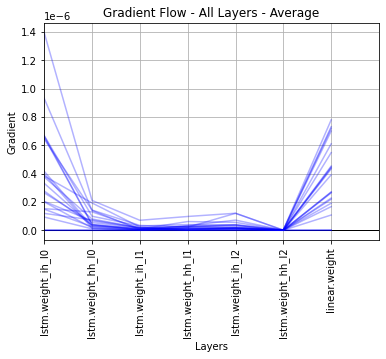

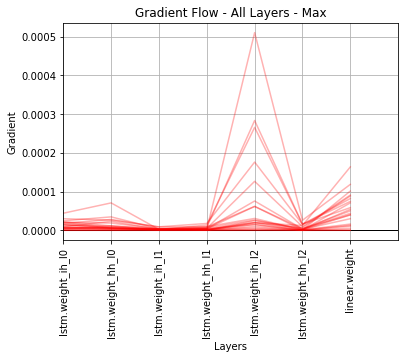

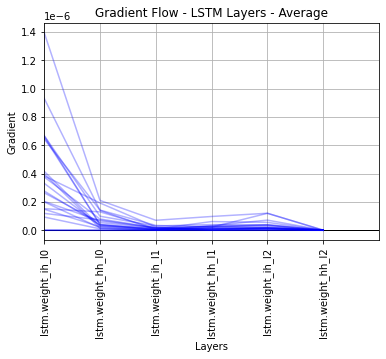

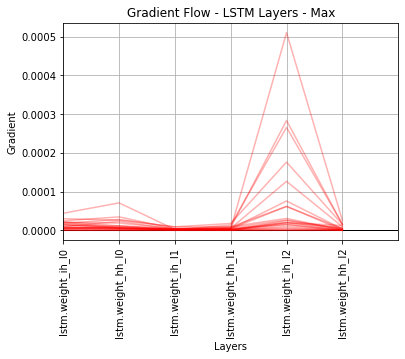

Number of gradients randomly sampled: 22
7
22
22
22
[6.48878564e-18 4.60419715e-22 0.00000000e+00 1.83046022e-24
 0.00000000e+00 3.92517763e-30 8.00762445e-32]
[3.78418913e-07 6.53275979e-08 1.31841396e-08 2.00973755e-08
 3.03246163e-08 6.40152715e-10 3.62071472e-07]
[4.41232478e-05 7.07813524e-05 8.94993718e-06 1.76642261e-05
 5.10768034e-04 2.59330318e-05 1.63689620e-04]



Computing initial allocation policy from the training set...
Number of returns from training used for policy: 593
Initial Q:
 [7.38897024e-06 7.69288392e-04 1.46515075e-03 2.09531403e-03
 2.77879855e-03 3.64920113e-03 4.62896778e-03]
Expected Gains per Bin: [ 0.          4.52627727  0.68104583 13.89834033 -2.56114869  3.93223338
 -0.892534   20.388138  ]
Trades per bin: [ 0. 15.  9. 13.  9.  8.  4. 28.]

Initial Allocation Policy: [0 1 1 1 0 1 0 1]

PERFORMING VALIDATION...
Buy and Hold Baseline:
Price at start: $147.10
Price at end: $112.52
Difference: $-34.58
Return:-23.51%

Profit from trading:19.98
Return from trading:13.58%
Num trades:104
Length Returns: 1096
Q:
 [7.38897024e-06 1.09683472e-03 2.12883878e-03 3.30148966e-03
 4.53752973e-03 5.96599807e-03 8.05405178e-03]
E:
 [ 0.          8.67547145 -0.32383701 12.62129839 -2.56114869  5.62018629
 -0.892534   27.52231331]
A:
 [0 1 0 1 0 1 0 1]
C:
 [ 0.  4.  1.  2.  0.  2.  0. 43.]
Test Time: 0.1441959023475647
N: 503 	MDA:48.51 	MA

In [169]:
model, journal, result, policy_dict = run_hypers(resume_dir='', resume_epoch=-1, window_size=11, asset='SPY', train_epochs=2000, iter_per_seq=3, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-3, dr=0.995, wd=0, trading_validation_period=50, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)

C:\Users\q2\Anaconda3\envs\mlp\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Building LSTM Model with the following parameters:
Architecture: LH
Num layers: 3
Hidden size: 128
Dropout: 0.5
Learning Rate: 0.0001
LR Decay Rate: 1
Weight Decay: 0
Window size: 11
Num Epochs: 1000
Iterations per seq: 3
Start training...
Loaded existing model: CH14 - Exp 2 - 2000 epochs/2021-03-01-20-54-12/saved_models\epoch1999.mdl
Epc  AvTrLoss  AvTrMSE   AvValMSE  MdnTrMSE  MdnValMSE  ValMDA    ValMAPE  ValMAE    PXcorr  RXcorr Secs    TTlMins
   0 2.90e-06  6.51e-06  6.12e-06  2.19e-06  2.28e-06   68.19     0.63     1.88e-03  1.00    0.74   12.29   0.2
Trading Validation -  MDA:54.67   Returns Correl:0.07   Num Trades: 136   Return%:25.79
   1 2.49e-06  7.03e-06  5.75e-06  2.41e-06  1.38e-06   70.08     0.56     1.67e-03  1.00    0.75   16.18   0.6
   2 2.76e-06  7.13e-06  5.42e-06  2.60e-06  1.99e-06   69.27     0.57     1.70e-03  1.00    0.76   13.16   0.9
   3 2.49e-06  6.56e-06  5.55e-06  2.72e-06  1.44e-06   69.27     0.57     1.70e-03  1.00    0.76   13.65   1.1
   4 2.59e-

  64 2.52e-06  6.75e-06  6.22e-06  2.10e-06  1.59e-06   64.42     0.59     1.76e-03  1.00    0.74   13.34   15.3
  65 2.56e-06  6.35e-06  5.66e-06  2.02e-06  1.45e-06   70.62     0.55     1.65e-03  1.00    0.76   13.07   15.5
  66 2.46e-06  6.30e-06  5.66e-06  1.81e-06  1.66e-06   70.08     0.57     1.69e-03  1.00    0.76   12.73   15.7
  67 2.61e-06  6.54e-06  5.13e-06  2.19e-06  1.30e-06   67.39     0.53     1.59e-03  1.00    0.78   12.26   15.9
  68 2.39e-06  6.17e-06  4.69e-06  1.92e-06  1.25e-06   72.51     0.50     1.50e-03  1.00    0.80   12.00   16.1
  69 2.63e-06  6.53e-06  5.56e-06  2.07e-06  1.36e-06   69.00     0.54     1.62e-03  1.00    0.76   14.32   16.3
  70 2.82e-06  6.12e-06  6.21e-06  2.14e-06  1.75e-06   69.27     0.61     1.82e-03  1.00    0.74   12.22   16.5
Trading Validation -  MDA:52.29   Returns Correl:0.06   Num Trades: 150   Return%:32.35
  71 2.22e-06  5.94e-06  5.90e-06  2.10e-06  1.40e-06   69.54     0.56     1.68e-03  1.00    0.75   12.26   16.9
  72 2.7

 132 2.49e-06  6.28e-06  5.23e-06  2.36e-06  1.68e-06   70.08     0.55     1.64e-03  1.00    0.78   12.92   31.3
 133 2.58e-06  7.02e-06  6.01e-06  2.45e-06  1.44e-06   67.39     0.58     1.73e-03  1.00    0.75   12.59   31.5
 134 2.48e-06  7.02e-06  5.88e-06  2.30e-06  1.85e-06   68.46     0.58     1.73e-03  1.00    0.75   14.14   31.8
 135 2.77e-06  6.50e-06  6.13e-06  2.20e-06  2.09e-06   66.58     0.61     1.82e-03  1.00    0.74   14.92   32.0
 136 2.25e-06  6.93e-06  5.82e-06  2.67e-06  1.80e-06   66.85     0.58     1.75e-03  1.00    0.75   13.74   32.2
 137 2.18e-06  5.73e-06  5.77e-06  1.93e-06  1.89e-06   68.46     0.59     1.76e-03  1.00    0.76   12.70   32.4
 138 2.16e-06  5.68e-06  5.16e-06  1.90e-06  1.38e-06   70.08     0.54     1.62e-03  1.00    0.78   12.19   32.7
 139 2.46e-06  5.64e-06  4.81e-06  1.98e-06  1.49e-06   72.24     0.52     1.55e-03  1.00    0.79   12.86   32.9
 140 2.81e-06  6.79e-06  5.73e-06  2.26e-06  1.65e-06   67.92     0.57     1.68e-03  1.00    0.7

 200 2.40e-06  5.54e-06  4.80e-06  1.97e-06  1.65e-06   68.46     0.54     1.61e-03  1.00    0.79   14.91   47.5
Trading Validation -  MDA:52.49   Returns Correl:0.08   Num Trades: 144   Return%:33.06
 201 2.42e-06  6.57e-06  5.77e-06  2.58e-06  1.44e-06   68.46     0.57     1.70e-03  1.00    0.77   12.58   47.8
 202 2.23e-06  5.08e-06  4.73e-06  1.99e-06  1.54e-06   67.65     0.52     1.55e-03  1.00    0.79   12.67   48.1
 203 2.64e-06  6.65e-06  5.00e-06  2.64e-06  1.39e-06   71.16     0.53     1.59e-03  1.00    0.78   13.11   48.3
 204 2.63e-06  6.64e-06  5.26e-06  2.56e-06  1.48e-06   69.00     0.54     1.60e-03  1.00    0.77   14.06   48.5
 205 2.45e-06  6.07e-06  5.89e-06  1.70e-06  1.70e-06   67.12     0.58     1.72e-03  1.00    0.76   14.70   48.8
 206 2.86e-06  6.74e-06  6.04e-06  2.46e-06  1.89e-06   71.43     0.61     1.79e-03  1.00    0.75   12.90   49.0
 207 2.90e-06  7.01e-06  6.67e-06  2.48e-06  2.54e-06   66.04     0.65     1.92e-03  0.99    0.73   12.46   49.2
 208 2.6

 268 2.69e-06  6.00e-06  5.16e-06  2.01e-06  1.64e-06   68.19     0.56     1.66e-03  1.00    0.78   12.27   63.5
 269 2.26e-06  5.67e-06  5.27e-06  2.13e-06  1.10e-06   69.81     0.52     1.57e-03  1.00    0.78   12.06   63.7
 270 2.58e-06  5.66e-06  4.97e-06  1.96e-06  1.49e-06   69.81     0.54     1.62e-03  1.00    0.79   12.58   63.9
Trading Validation -  MDA:52.88   Returns Correl:0.12   Num Trades: 146   Return%:27.28
 271 2.58e-06  7.29e-06  5.62e-06  2.65e-06  1.84e-06   67.12     0.58     1.73e-03  1.00    0.76   14.46   64.3
 272 2.67e-06  6.30e-06  5.91e-06  2.17e-06  1.69e-06   71.16     0.59     1.77e-03  1.00    0.75   12.62   64.5
 273 2.08e-06  4.82e-06  4.69e-06  1.48e-06  1.52e-06   70.89     0.53     1.57e-03  1.00    0.79   12.26   64.7
 274 2.47e-06  6.58e-06  5.04e-06  2.06e-06  1.05e-06   70.08     0.50     1.52e-03  1.00    0.78   12.33   64.9
 275 2.99e-06  6.92e-06  6.09e-06  2.73e-06  2.09e-06   67.12     0.62     1.83e-03  1.00    0.75   12.11   65.1
 276 2.3

 336 2.36e-06  5.81e-06  5.01e-06  2.22e-06  1.30e-06   68.73     0.52     1.57e-03  1.00    0.78   12.49   79.5
 337 2.35e-06  6.21e-06  4.66e-06  2.50e-06  1.26e-06   70.08     0.52     1.56e-03  1.00    0.80   14.74   79.7
 338 2.60e-06  6.93e-06  5.03e-06  2.60e-06  1.32e-06   70.89     0.53     1.59e-03  1.00    0.79   13.07   80.0
 339 2.28e-06  6.02e-06  5.27e-06  1.80e-06  1.04e-06   69.81     0.52     1.55e-03  1.00    0.78   15.92   80.2
 340 2.44e-06  5.57e-06  5.09e-06  2.04e-06  1.56e-06   69.54     0.54     1.60e-03  1.00    0.78   13.57   80.4
Trading Validation -  MDA:51.69   Returns Correl:0.10   Num Trades: 136   Return%:7.40
 341 2.57e-06  6.67e-06  5.73e-06  2.11e-06  1.34e-06   69.81     0.55     1.64e-03  1.00    0.75   12.08   80.8
 342 2.34e-06  5.89e-06  4.76e-06  2.06e-06  1.26e-06   69.54     0.52     1.55e-03  1.00    0.79   12.12   81.0
 343 2.62e-06  6.12e-06  5.86e-06  2.16e-06  1.73e-06   68.46     0.58     1.73e-03  1.00    0.76   15.17   81.3
 344 2.83

 404 2.48e-06  6.33e-06  5.19e-06  2.02e-06  1.62e-06   67.65     0.55     1.64e-03  1.00    0.78   12.09   95.7
 405 2.62e-06  6.26e-06  5.62e-06  2.07e-06  1.60e-06   72.78     0.57     1.70e-03  1.00    0.76   16.19   96.0
 406 2.63e-06  6.66e-06  5.13e-06  2.60e-06  2.05e-06   67.39     0.58     1.74e-03  1.00    0.78   12.46   96.2
 407 2.54e-06  5.46e-06  5.14e-06  2.14e-06  1.57e-06   70.89     0.54     1.62e-03  1.00    0.78   12.08   96.4
 408 2.27e-06  5.42e-06  4.64e-06  1.97e-06  1.69e-06   70.35     0.54     1.61e-03  1.00    0.80   14.68   96.7
 409 2.58e-06  6.48e-06  5.42e-06  2.23e-06  1.44e-06   67.92     0.55     1.65e-03  1.00    0.78   13.11   96.9
 410 2.18e-06  5.06e-06  4.19e-06  1.96e-06  1.30e-06   71.97     0.49     1.47e-03  1.00    0.81   13.67   97.1
Trading Validation -  MDA:53.08   Returns Correl:0.09   Num Trades: 130   Return%:7.08
 411 2.42e-06  5.68e-06  5.07e-06  2.28e-06  1.67e-06   68.73     0.56     1.66e-03  1.00    0.78   12.28   97.5
 412 2.32

 471 2.69e-06  6.42e-06  5.56e-06  2.17e-06  1.34e-06   69.81     0.55     1.66e-03  1.00    0.76   14.99   111.7
 472 2.48e-06  6.62e-06  4.68e-06  2.29e-06  1.33e-06   68.19     0.51     1.53e-03  1.00    0.80   12.59   111.9
 473 2.72e-06  6.17e-06  5.82e-06  2.43e-06  2.61e-06   66.04     0.62     1.84e-03  1.00    0.77   12.10   112.1
 474 2.33e-06  5.77e-06  5.32e-06  1.95e-06  1.71e-06   69.54     0.57     1.70e-03  1.00    0.78   12.27   112.3
 475 2.04e-06  5.27e-06  4.43e-06  1.89e-06  1.47e-06   71.43     0.51     1.54e-03  1.00    0.81   12.19   112.5
 476 2.25e-06  5.72e-06  5.18e-06  1.81e-06  1.59e-06   68.73     0.56     1.65e-03  1.00    0.78   12.15   112.7
 477 3.07e-06  6.46e-06  6.14e-06  2.15e-06  1.75e-06   68.46     0.59     1.77e-03  1.00    0.75   14.60   112.9
 478 2.21e-06  6.25e-06  5.64e-06  2.69e-06  1.97e-06   65.50     0.59     1.75e-03  1.00    0.76   14.37   113.2
 479 2.35e-06  5.99e-06  4.94e-06  2.08e-06  1.36e-06   71.43     0.53     1.59e-03  1.0

 539 2.32e-06  6.01e-06  4.82e-06  2.18e-06  1.35e-06   69.81     0.52     1.56e-03  1.00    0.80   14.18   127.4
 540 2.41e-06  5.74e-06  5.02e-06  2.12e-06  1.71e-06   71.16     0.55     1.65e-03  1.00    0.78   14.89   127.7
Trading Validation -  MDA:50.70   Returns Correl:0.15   Num Trades: 142   Return%:0.67
 541 2.23e-06  5.67e-06  5.00e-06  1.95e-06  1.56e-06   67.65     0.54     1.62e-03  1.00    0.78   12.04   128.0
 542 2.48e-06  5.76e-06  4.79e-06  2.26e-06  1.36e-06   69.54     0.53     1.59e-03  1.00    0.79   12.00   128.2
 543 2.78e-06  6.36e-06  5.49e-06  2.77e-06  2.17e-06   67.92     0.59     1.76e-03  1.00    0.78   12.94   128.5
 544 2.55e-06  5.85e-06  5.83e-06  2.14e-06  2.05e-06   65.50     0.60     1.79e-03  1.00    0.76   14.56   128.7
 545 2.35e-06  5.50e-06  5.04e-06  2.07e-06  1.55e-06   67.65     0.56     1.66e-03  1.00    0.78   12.28   128.9
 546 2.34e-06  5.11e-06  4.32e-06  2.01e-06  1.30e-06   68.73     0.50     1.48e-03  1.00    0.81   12.05   129.1
 

 606 2.25e-06  5.49e-06  4.78e-06  2.10e-06  1.54e-06   69.81     0.54     1.60e-03  1.00    0.80   14.86   143.1
 607 2.54e-06  6.03e-06  4.47e-06  2.12e-06  1.33e-06   69.27     0.51     1.52e-03  1.00    0.81   12.49   143.4
 608 3.11e-06  6.27e-06  6.25e-06  2.40e-06  2.18e-06   69.00     0.62     1.85e-03  1.00    0.75   12.16   143.6
 609 2.29e-06  5.44e-06  5.06e-06  2.25e-06  1.56e-06   69.00     0.55     1.64e-03  1.00    0.79   12.14   143.8
 610 2.27e-06  5.73e-06  4.77e-06  2.33e-06  1.92e-06   68.46     0.56     1.67e-03  1.00    0.80   12.92   144.0
Trading Validation -  MDA:52.68   Returns Correl:0.12   Num Trades: 168   Return%:9.36
 611 2.51e-06  5.53e-06  4.68e-06  2.17e-06  1.74e-06   67.92     0.54     1.62e-03  1.00    0.81   14.10   144.4
 612 2.39e-06  5.58e-06  5.02e-06  2.02e-06  1.87e-06   68.46     0.57     1.69e-03  1.00    0.79   12.15   144.6
 613 2.70e-06  6.11e-06  5.23e-06  1.95e-06  1.77e-06   70.62     0.57     1.71e-03  1.00    0.78   11.95   144.8
 

 673 2.55e-06  6.06e-06  5.16e-06  2.17e-06  1.78e-06   70.62     0.56     1.68e-03  1.00    0.78   13.15   158.8
 674 2.43e-06  6.28e-06  4.75e-06  2.48e-06  1.33e-06   67.92     0.52     1.55e-03  1.00    0.80   12.13   159.0
 675 2.09e-06  5.28e-06  4.29e-06  2.04e-06  1.33e-06   71.16     0.50     1.51e-03  1.00    0.81   11.91   159.2
 676 2.36e-06  5.58e-06  4.48e-06  1.78e-06  1.34e-06   68.19     0.53     1.57e-03  1.00    0.81   11.97   159.4
 677 2.69e-06  5.43e-06  4.93e-06  2.05e-06  1.66e-06   71.43     0.54     1.61e-03  1.00    0.78   12.53   159.7
 678 2.27e-06  5.47e-06  4.70e-06  2.08e-06  1.44e-06   68.73     0.53     1.58e-03  1.00    0.80   14.33   159.9
 679 2.38e-06  5.75e-06  4.67e-06  1.98e-06  1.44e-06   67.12     0.53     1.58e-03  1.00    0.80   12.25   160.1
 680 2.73e-06  5.91e-06  5.86e-06  1.98e-06  2.62e-06   68.19     0.62     1.84e-03  1.00    0.76   12.06   160.3
Trading Validation -  MDA:52.49   Returns Correl:0.12   Num Trades: 148   Return%:17.41


Trading Validation -  MDA:49.11   Returns Correl:-0.06   Num Trades: 160   Return%:-19.34
 741 2.31e-06  5.64e-06  4.65e-06  1.91e-06  1.59e-06   68.73     0.54     1.61e-03  1.00    0.81   12.03   174.6
 742 2.37e-06  6.11e-06  4.71e-06  2.18e-06  1.50e-06   70.35     0.52     1.57e-03  1.00    0.80   12.76   174.9
 743 2.48e-06  5.26e-06  4.77e-06  1.89e-06  1.50e-06   71.16     0.54     1.61e-03  1.00    0.79   14.11   175.1
 744 2.53e-06  5.83e-06  5.99e-06  2.01e-06  1.63e-06   70.62     0.59     1.75e-03  1.00    0.76   12.84   175.3
 745 3.39e-06  7.57e-06  5.55e-06  2.11e-06  1.82e-06   70.89     0.59     1.78e-03  1.00    0.77   12.49   175.5
 746 2.47e-06  5.60e-06  4.81e-06  2.21e-06  1.60e-06   72.78     0.54     1.62e-03  1.00    0.80   12.10   175.7
 747 2.13e-06  5.17e-06  4.27e-06  1.98e-06  1.36e-06   71.97     0.51     1.52e-03  1.00    0.82   12.34   175.9
 748 2.46e-06  5.52e-06  5.21e-06  2.14e-06  1.59e-06   70.62     0.57     1.71e-03  1.00    0.79   12.08   176.

 808 2.70e-06  5.72e-06  4.99e-06  2.29e-06  1.60e-06   67.65     0.55     1.65e-03  1.00    0.79   15.43   189.9
 809 3.30e-06  6.79e-06  6.17e-06  2.40e-06  1.81e-06   71.70     0.62     1.83e-03  1.00    0.74   12.27   190.1
 810 2.44e-06  5.77e-06  4.51e-06  2.08e-06  1.71e-06   69.00     0.54     1.60e-03  1.00    0.81   13.52   190.4
Trading Validation -  MDA:49.30   Returns Correl:0.03   Num Trades: 156   Return%:7.29
 811 2.19e-06  5.97e-06  4.80e-06  2.12e-06  1.67e-06   70.08     0.55     1.63e-03  1.00    0.80   11.99   190.7
 812 3.12e-06  5.45e-06  5.51e-06  2.48e-06  2.36e-06   66.58     0.61     1.81e-03  1.00    0.77   12.99   190.9
 813 2.51e-06  5.51e-06  4.33e-06  2.62e-06  2.02e-06   70.62     0.54     1.61e-03  1.00    0.81   12.87   191.1
 814 2.34e-06  5.60e-06  4.19e-06  1.88e-06  1.47e-06   71.70     0.52     1.54e-03  1.00    0.82   13.70   191.4
 815 3.16e-06  6.32e-06  6.07e-06  2.09e-06  1.74e-06   70.89     0.61     1.81e-03  1.00    0.75   13.25   191.6
 

 875 2.56e-06  5.85e-06  4.91e-06  2.37e-06  1.94e-06   67.92     0.57     1.70e-03  1.00    0.80   14.67   205.5
 876 2.02e-06  4.45e-06  4.74e-06  1.40e-06  1.52e-06   72.78     0.53     1.60e-03  1.00    0.80   13.67   205.7
 877 2.40e-06  5.32e-06  4.58e-06  2.05e-06  1.55e-06   71.16     0.54     1.61e-03  1.00    0.81   12.32   205.9
 878 2.23e-06  5.59e-06  4.38e-06  1.85e-06  1.45e-06   68.73     0.52     1.56e-03  1.00    0.81   11.90   206.1
 879 2.57e-06  5.72e-06  4.98e-06  1.76e-06  1.79e-06   69.27     0.55     1.66e-03  1.00    0.79   12.08   206.3
 880 1.96e-06  4.97e-06  3.98e-06  1.87e-06  1.08e-06   69.00     0.48     1.43e-03  1.00    0.82   14.99   206.6
Trading Validation -  MDA:48.31   Returns Correl:0.01   Num Trades: 152   Return%:-14.25
 881 2.18e-06  5.41e-06  4.62e-06  1.78e-06  1.63e-06   69.27     0.54     1.61e-03  1.00    0.80   12.07   207.0
 882 1.98e-06  4.94e-06  4.02e-06  1.86e-06  1.25e-06   69.27     0.50     1.49e-03  1.00    0.82   11.97   207.2

 942 2.77e-06  6.14e-06  5.23e-06  2.28e-06  1.84e-06   69.54     0.57     1.72e-03  1.00    0.78   14.21   221.1
 943 2.34e-06  5.46e-06  4.52e-06  1.93e-06  1.30e-06   69.00     0.52     1.56e-03  1.00    0.81   12.31   221.3
 944 2.48e-06  5.69e-06  4.83e-06  2.44e-06  1.74e-06   68.46     0.55     1.65e-03  1.00    0.79   12.23   221.5
 945 2.44e-06  5.60e-06  4.08e-06  2.30e-06  1.50e-06   74.39     0.51     1.53e-03  1.00    0.83   12.01   221.7
 946 2.81e-06  5.56e-06  5.13e-06  1.62e-06  1.70e-06   71.16     0.56     1.67e-03  1.00    0.78   12.25   221.9
 947 2.43e-06  6.29e-06  4.58e-06  2.40e-06  1.35e-06   67.92     0.52     1.57e-03  1.00    0.80   17.04   222.2
 948 2.06e-06  5.21e-06  4.27e-06  1.96e-06  1.20e-06   70.08     0.50     1.50e-03  1.00    0.82   13.85   222.4
 949 2.29e-06  5.47e-06  4.66e-06  2.00e-06  1.52e-06   70.35     0.54     1.60e-03  1.00    0.81   12.59   222.6
 950 2.67e-06  6.05e-06  4.56e-06  2.11e-06  1.46e-06   71.70     0.54     1.62e-03  1.0

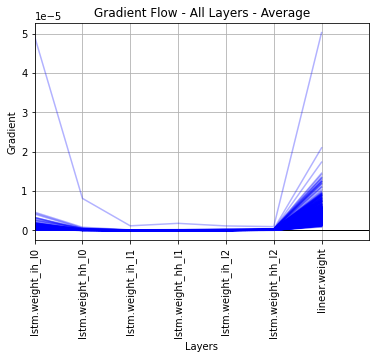

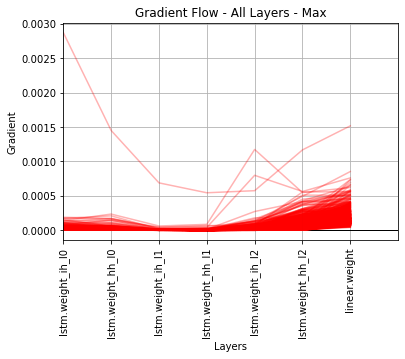

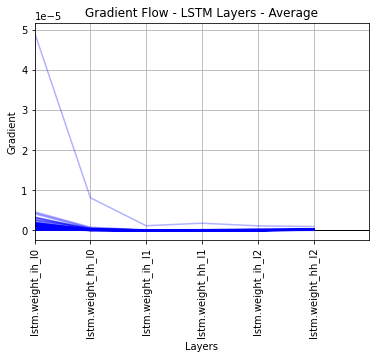

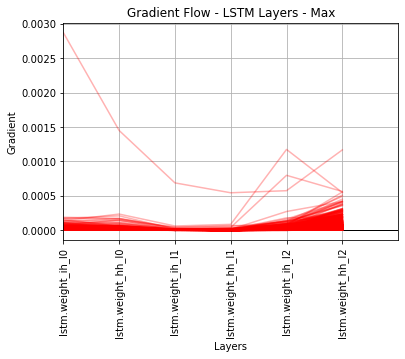

Number of gradients randomly sampled: 1003
7
1003
1003
1003
[3.91347263e-15 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 2.68340038e-18 2.35229283e-14]
[4.26636713e-07 4.90752061e-08 8.42435648e-09 8.99497817e-09
 2.17350830e-08 6.41224751e-08 3.88940289e-06]
[0.00287293 0.00145067 0.0006891  0.00054523 0.00117512 0.00116842
 0.001518  ]



Computing initial allocation policy from the training set...
Number of returns from training used for policy: 593
Initial Q:
 [6.30428831e-06 6.63024889e-04 1.42867376e-03 2.31563706e-03
 2.99519789e-03 3.91375006e-03 5.16359384e-03]
Expected Gains per Bin: [ 0.          8.51162873  9.660328    3.31664303  7.55965594 11.98004911
  4.50808319 66.79701772]
Trades per bin: [ 0. 15. 14. 11. 10. 10.  8. 38.]

Initial Allocation Policy: [0 1 1 1 1 1 1 1]

PERFORMING VALIDATION...
Buy and Hold Baseline:
Price at start: $147.10
Price at end: $112.52
Difference: $-34.58
Return:-23.51%

Profit from trading:14.90
Return from trading:10.13%
Num trades:146
Length Returns: 1096
Q:
 [6.30428831e-06 1.05137354e-03 2.35049626e-03 3.43028526e-03
 4.78623453e-03 6.53954034e-03 8.83715824e-03]
E:
 [ 0.          9.29987081 16.58063087 14.00451247 12.75281742 16.49038856
 14.01407356 53.97979294]
A:
 [0 1 1 1 1 1 1 1]
C:
 [ 0.  4.  4.  9.  5.  6.  3. 42.]
Test Time: 0.15642031033833823
N: 503 	MDA:51.89 	M

In [106]:
# Example of resuming training on a previous run
model, journal, result, policy_dict = run_hypers(resume_dir='CH14 - Exp 2 - 2000 epochs/2021-03-01-20-54-12', resume_epoch=-1, window_size=11, asset='SPY', train_epochs=1000, iter_per_seq=3, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, trading_validation_period=10, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)

In [183]:
def run_out_of_sample_test(model, D, Q, E, A, asset='SPY', window_size=11, iter_per_seq=3, lr=1E-3, dr=0):
    
    # Go get the data for the asset
    abs_df = get_data(asset_name=asset, directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019')

    # Add the Prev Adj Close, drop volume etc
    abs_df = add_features_to_df(abs_df)
    
    # Normalise the entire dataset
    df, scale, offset = normalise_df(abs_df)
    
    # Out of sample test set
    test_start = '01-01-2010'
    test_end = '12-20-2019'
    
#    test_asset_dict = {}
       
#    backup_index = len(test_asset_df) - window_size
#    backup_date = df['Date'].iloc[backup_index]
    
    # Mask off the test data and assign result to a test_asset dataframe
    mask = (df['Date'] >= test_start) & (df['Date'] <= test_end)
    test_asset_df = df.loc[mask]
    
    # Reset the indices to start from 0 again for each of the dataframes
    test_asset_df.index = np.arange(test_asset_df.shape[0]) 
    
    # Generate test attribute set
    test_seq, test_labels = create_input_sequences_from_df(test_asset_df, window_size)

    # Convert our list of lists to Tensors
    test_seq = torch.FloatTensor(test_seq)
    test_labels = torch.FloatTensor(test_labels)
        
    percentiles = [0,10,20,30,40,50,60]

    model, D, Q, E, A, journal, test_result_dict = test_trading_system(model, test_seq, test_labels, D, Q, E, A, percentiles, basefn='test', scale=scale, offset=offset, iter_per_seq=iter_per_seq, lr = lr, dr = dr, verbosity=0)
    
    return model, D, Q, E, A, test_result_dict
   
    

In [184]:
def run_trading_validation(model, D, Q, E, A, asset='SPY', window_size=11, iter_per_seq=3, lr=1E-3, dr=0):
    
    
    # Go get the data for the asset
    abs_df = get_data(asset_name=asset, directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019')

    # Add the Prev Adj Close, drop volume etc
    abs_df = add_features_to_df(abs_df)
    
    # Normalise the entire dataset
    df, scale, offset = normalise_df(abs_df)
    
    # Training set
    train_start = '01-01-2005'
    train_end = '01-01-2008'    

    # Validation set
    valid_start = '01-02-2008'
    valid_end = '12-31-2009'    
            
    # Mask off the training data and assign result to a train_asset dataframe
    mask = (df['Date'] >= train_start) & (df['Date'] <= train_end)
    train_asset_df = df.loc[mask]
    
    backup_index = len(train_asset_df) - window_size
    backup_date = df['Date'].iloc[backup_index]
    
    # Mask off the validation data and assign result to a valid_asset dataframe

    mask = (df['Date'] >= backup_date) & (df['Date'] <= valid_end)
    valid_asset_df = df.loc[mask]
           
    # Reset the indices to start from 0 again for each of the dataframes
    train_asset_df.index = np.arange(train_asset_df.shape[0])   
    valid_asset_df.index = np.arange(valid_asset_df.shape[0])    

    # Generate validation attribute set
    valid_seq, valid_labels = create_input_sequences_from_df(valid_asset_df, window_size)

    # Convert our list of lists to Tensors
    valid_seq = torch.FloatTensor(valid_seq)
    valid_labels = torch.FloatTensor(valid_labels)
                    
    percentiles = [0,10,20,30,40,50,60]

    model, D, Q, E, A, journal, test_result_dict = test_trading_system(model, valid_seq, valid_labels, D, Q, E, A, percentiles, basefn='trade_val', scale=scale, offset=offset, iter_per_seq=iter_per_seq, lr = lr, dr = dr, verbosity=0)
    
#    print(test_result_dict)
    return model, D, Q, E, A, test_result_dict
   

In [192]:
# This function runs a validation / test repeatability evaluation on a saved model from training

def run_trading_trials(basefn='', model_num=-1, num_trials=10, run_test=0, iter_per_seq=3, lr=1E-3, dr=0):

    model_fn = basefn + 'epoch' + str(m) + '.mdl'
    print(model_fn)
    
    DQEA_fn = basefn + 'DQEAC_dict' + str(m) + '.pkl'
    print(DQEA_fn)
    
    val_trades = []
    test_trades = []
    val_returns = []
    test_returns = []

    for i in range(num_trials):
        saved_model = torch.load(model_fn)
    
        with open(DQEA_fn, 'rb') as fp:
            saved_DQEAC = pickle.load(fp)
        
        D, Q, E, A, C = saved_DQEAC['D'], saved_DQEAC['Q'], saved_DQEAC['E'], saved_DQEAC['A'], saved_DQEAC['C']    
    
        model, D, Q, E, A, result_dict = run_trading_validation(saved_model, D, Q, E, A, iter_per_seq=iter_per_seq, lr=lr, dr=dr)
        print("Val:", i, iter_per_seq, lr,dr, result_dict['num_trades'], result_dict['trade_return'])
        val_returns.append(result_dict['trade_return'])
        val_trades.append(result_dict['num_trades'])
        
        with open('neil_val.csv', 'a', newline='') as myfile:
            wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
            wr.writerow([i, iter_per_seq, lr, dr, result_dict['num_trades'],result_dict['trade_return']])
    
        if run_test:
            model, D, Q, E, A, test_result_dict = run_out_of_sample_test(model, D, Q, E, A, iter_per_seq=iter_per_seq, lr=lr, dr=dr)
            print("Test:", i, test_result_dict['num_trades'], test_result_dict['trade_return'])
            test_returns.append(test_result_dict['trade_return'])
            test_trades.append(test_result_dict['num_trades'])    
        
            with open('test.csv', 'a', newline='') as myfile:
                wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
                wr.writerow([i,test_result_dict['num_trades'],test_result_dict['trade_return']])

    print(m, np.mean(val_trades),np.mean(val_returns), np.mean(test_trades),np.mean(test_returns))
    
    with open('val_test.csv', 'a', newline='') as myfile:
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        if run_test:
            wr.writerow([i,iter_per_seq, lr, dr,np.mean(val_trades),np.mean(val_returns),np.std(val_returns),np.min(val_returns),np.max(val_returns),
                     np.mean(test_trades),np.mean(test_returns),np.std(test_returns),np.min(test_returns),np.max(test_returns)])
        else:
            wr.writerow([i,iter_per_seq, lr, dr,np.mean(val_trades),np.mean(val_returns),np.std(val_returns),np.min(val_returns),np.max(val_returns)])

    

In [188]:
basefn = 'CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/'
run_trading_trials(basefn=basefn, model_num=1050, num_trials=10, run_test=0, iter_per_seq=3, lr=1E-3, dr=1)

CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/epoch1050.mdl
CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/DQEAC_dict1050.pkl


C:\Users\q2\Anaconda3\envs\mlp\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Val: 0 3 0.001 1 143 16.233849287885466
Val: 1 3 0.001 1 148 20.482685501580864
Val: 2 3 0.001 1 139 22.270571617652063
Val: 3 3 0.001 1 137 16.804905693873817
Val: 4 3 0.001 1 129 1.5091758232303347
Val: 5 3 0.001 1 156 18.99384374864025
Val: 6 3 0.001 1 147 20.224366389565507
Val: 7 3 0.001 1 146 6.430978114703107
Val: 8 3 0.001 1 150 20.04080768844546
Val: 9 3 0.001 1 151 13.963267642886652
1050 144.6 15.69544515084635 nan nan


In [232]:
basefn = 'CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/'

with open('val_test.csv', 'w', newline='') as myfile:
    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    wr.writerow(['N','Num Iters','LR','LRD','Num Trades','Rt%',
                 'StDev Rt%','Min','Max'])

with open('neil_val.csv', 'w', newline='') as myfile:
    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    wr.writerow(['Model#','ValTrades','ValRt%','StdDev','Min','Max',
                 'TestTrades','TestRt%','StdDev','Min','Max'])
    
with open('neil_test.csv', 'w', newline='') as myfile:
    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    wr.writerow(['Model#','ValTrades','ValRt%','StdDev','Min','Max',
                 'TestTrades','TestRt%','StdDev','Min','Max'])    

for lr in [2E-4, 5E-4, 1E-3]:
    for j in range(1,11):
        run_trading_trials(basefn=basefn, model_num=1050, num_trials=100, run_test=0, iter_per_seq=j, lr=lr, dr=1)


CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/epoch1050.mdl
CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/DQEAC_dict1050.pkl


C:\Users\q2\Anaconda3\envs\mlp\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Val: 0 1 0.0002 1 48 -10.978951156206078
Val: 1 1 0.0002 1 52 -18.654000706562726
Val: 2 1 0.0002 1 54 -21.386826869578538
Val: 3 1 0.0002 1 44 -20.707007527506658
Val: 4 1 0.0002 1 42 -17.913010541563658
Val: 5 1 0.0002 1 50 -20.224360950466856
Val: 6 1 0.0002 1 46 -10.108787837452713
Val: 7 1 0.0002 1 42 -24.96943332917019
Val: 8 1 0.0002 1 48 -17.804247605480125
Val: 9 1 0.0002 1 44 -16.02993747963044
Val: 10 1 0.0002 1 38 -23.072746203324936
Val: 11 1 0.0002 1 40 -25.193758074645302
Val: 12 1 0.0002 1 42 -14.452783801516901
Val: 13 1 0.0002 1 34 -23.77975831907969
Val: 14 1 0.0002 1 40 -22.02585569135145
Val: 15 1 0.0002 1 46 -19.80967863056365
Val: 16 1 0.0002 1 46 -14.078905599659283
Val: 17 1 0.0002 1 48 -28.538447481244383
Val: 18 1 0.0002 1 50 -15.023815731561346
Val: 19 1 0.0002 1 38 -24.47314549272512
Val: 20 1 0.0002 1 40 -28.59960470642495
Val: 21 1 0.0002 1 44 -28.26650886621834
Val: 22 1 0.0002 1 38 -22.066643492101104
Val: 23 1 0.0002 1 46 -17.355562760388693
Val: 24 1 

Val: 93 2 0.0002 1 82 -2.970778570149584
Val: 94 2 0.0002 1 86 -2.005458220576757
Val: 95 2 0.0002 1 88 -1.760731416078848
Val: 96 2 0.0002 1 84 -2.284163074318974
Val: 97 2 0.0002 1 104 1.7403130397601134
Val: 98 2 0.0002 1 86 -13.575805292159547
Val: 99 2 0.0002 1 90 2.8959964028596845
1050 83.8 -2.317218162913969 nan nan
CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/epoch1050.mdl
CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/DQEAC_dict1050.pkl
Val: 0 3 0.0002 1 114 17.301125541585805
Val: 1 3 0.0002 1 101 -1.1693028661102562
Val: 2 3 0.0002 1 120 14.670217209006976
Val: 3 3 0.0002 1 121 17.60024061299879
Val: 4 3 0.0002 1 111 3.8069040095735294
Val: 5 3 0.0002 1 108 -3.031976588570001
Val: 6 3 0.0002 1 103 19.660087100490617
Val: 7 3 0.0002 1 115 16.04345907886549
Val: 8 3 0.0002 1 108 -3.24273350247157
Val: 9 3 0.0002 1 104 4.8402294095227925
Val: 10 3 0.0002 1 102 11.01970

Val: 78 4 0.0002 1 120 7.912925810109364
Val: 79 4 0.0002 1 131 12.40646707190809
Val: 80 4 0.0002 1 113 -3.038772742328727
Val: 81 4 0.0002 1 118 3.8001268926600655
Val: 82 4 0.0002 1 122 21.74708012932683
Val: 83 4 0.0002 1 118 0.7341504984511701
Val: 84 4 0.0002 1 125 2.9027599220265325
Val: 85 4 0.0002 1 119 13.5757644989197
Val: 86 4 0.0002 1 124 16.31539225479289
Val: 87 4 0.0002 1 113 -5.649262698588822
Val: 88 4 0.0002 1 109 -4.996603495607935
Val: 89 4 0.0002 1 116 -1.9306896510334732
Val: 90 4 0.0002 1 108 4.948956991465122
Val: 91 4 0.0002 1 114 1.971395865303428
Val: 92 4 0.0002 1 114 19.578495181695377
Val: 93 4 0.0002 1 120 23.41261644089569
Val: 94 4 0.0002 1 118 18.517993325359175
Val: 95 4 0.0002 1 117 2.970748655107029
Val: 96 4 0.0002 1 117 5.628776333537006
Val: 97 4 0.0002 1 120 12.032599748247764
Val: 98 4 0.0002 1 108 -1.4956215894034068
Val: 99 4 0.0002 1 116 16.322212884495524
1050 120.21 6.796976531178669 nan nan
CH15 - Exp2 - 4000 epoch runs with different LR

Val: 63 6 0.0002 1 151 6.825261095132845
Val: 64 6 0.0002 1 129 7.382714315406451
Val: 65 6 0.0002 1 164 14.575081934582098
Val: 66 6 0.0002 1 141 9.38134918673125
Val: 67 6 0.0002 1 147 11.318783320086307
Val: 68 6 0.0002 1 151 7.450705768036271
Val: 69 6 0.0002 1 152 7.21275880000115
Val: 70 6 0.0002 1 140 6.4513801737259024
Val: 71 6 0.0002 1 153 1.9306325404976856
Val: 72 6 0.0002 1 163 2.909545197587966
Val: 73 6 0.0002 1 152 11.148860439272886
Val: 74 6 0.0002 1 159 11.291625900544634
Val: 75 6 0.0002 1 139 12.188992871178167
Val: 76 6 0.0002 1 151 10.666194825387825
Val: 77 6 0.0002 1 145 3.2698392505761023
Val: 78 6 0.0002 1 153 10.224284377660537
Val: 79 6 0.0002 1 161 18.919072459547642
Val: 80 6 0.0002 1 154 7.6614273277966385
Val: 81 6 0.0002 1 135 14.038033492880613
Val: 82 6 0.0002 1 155 3.1406742554697753
Val: 83 6 0.0002 1 157 11.808296759167236
Val: 84 6 0.0002 1 129 2.9571373107443133
Val: 85 6 0.0002 1 153 1.6111453251044632
Val: 86 6 0.0002 1 159 4.738235431704755
V

Val: 48 8 0.0002 1 172 20.40787069969909
Val: 49 8 0.0002 1 181 21.80826726954995
Val: 50 8 0.0002 1 167 13.127076934278948
Val: 51 8 0.0002 1 164 2.5560391397105864
Val: 52 8 0.0002 1 191 35.12573441284888
Val: 53 8 0.0002 1 177 30.7613255115646
Val: 54 8 0.0002 1 175 32.44045141110159
Val: 55 8 0.0002 1 164 17.19915060061303
Val: 56 8 0.0002 1 177 27.66819169781403
Val: 57 8 0.0002 1 167 13.650500433871104
Val: 58 8 0.0002 1 176 25.390843814099046
Val: 59 8 0.0002 1 155 9.993122685186849
Val: 60 8 0.0002 1 177 20.543799213972264
Val: 61 8 0.0002 1 169 23.371774249159575
Val: 62 8 0.0002 1 179 36.15218207255971
Val: 63 8 0.0002 1 187 22.92311659956138
Val: 64 8 0.0002 1 179 18.78311403023191
Val: 65 8 0.0002 1 175 5.710351935036309
Val: 66 8 0.0002 1 163 21.400345749264268
Val: 67 8 0.0002 1 183 15.166532240945275
Val: 68 8 0.0002 1 167 12.50841209783831
Val: 69 8 0.0002 1 179 31.108016378837995
Val: 70 8 0.0002 1 174 35.22092951735887
Val: 71 8 0.0002 1 173 30.278654458580892
Val: 72

Val: 32 10 0.0002 1 187 10.197083445329692
Val: 33 10 0.0002 1 183 -0.8634324341783957
Val: 34 10 0.0002 1 201 14.031212863177977
Val: 35 10 0.0002 1 195 18.6471229663243
Val: 36 10 0.0002 1 213 21.92382363984289
Val: 37 10 0.0002 1 191 6.138640160203589
Val: 38 10 0.0002 1 189 20.60497003689945
Val: 39 10 0.0002 1 193 2.2500898408483527
Val: 40 10 0.0002 1 185 5.8666933865295725
Val: 41 10 0.0002 1 185 17.851766290804747
Val: 42 10 0.0002 1 182 23.752492117565094
Val: 43 10 0.0002 1 182 4.98977470725733
Val: 44 10 0.0002 1 211 20.38743872563374
Val: 45 10 0.0002 1 187 29.7756058225183
Val: 46 10 0.0002 1 196 16.825207129571652
Val: 47 10 0.0002 1 193 29.09579191954506
Val: 48 10 0.0002 1 195 -1.4548609841469877
Val: 49 10 0.0002 1 195 21.828642133079516
Val: 50 10 0.0002 1 203 19.347306293728455
Val: 51 10 0.0002 1 189 5.309267361749198
Val: 52 10 0.0002 1 177 25.118943272763524
Val: 53 10 0.0002 1 189 20.64574152035316
Val: 54 10 0.0002 1 187 17.90613008177591
Val: 55 10 0.0002 1 199

Val: 17 2 0.0005 1 105 1.9577981186873288
Val: 18 2 0.0005 1 106 2.6104301261749834
Val: 19 2 0.0005 1 116 28.8239104150548
Val: 20 2 0.0005 1 114 7.559427910879955
Val: 21 2 0.0005 1 110 13.568984662456913
Val: 22 2 0.0005 1 100 8.551957351431597
Val: 23 2 0.0005 1 101 -5.105426261776577
Val: 24 2 0.0005 1 105 -1.0469666593545341
Val: 25 2 0.0005 1 96 0.904108733405795
Val: 26 2 0.0005 1 104 7.6545876612487405
Val: 27 2 0.0005 1 111 0.7749382992008215
Val: 28 2 0.0005 1 96 6.464967042144709
Val: 29 2 0.0005 1 117 13.840879764693787
Val: 30 2 0.0005 1 107 -2.6580875085150883
Val: 31 2 0.0005 1 100 -0.5914938191523492
Val: 32 2 0.0005 1 111 0.108716703745037
Val: 33 2 0.0005 1 120 18.946229879089316
Val: 34 2 0.0005 1 119 -5.785226567003198
Val: 35 2 0.0005 1 102 16.390204337125347
Val: 36 2 0.0005 1 105 -11.04694532838522
Val: 37 2 0.0005 1 107 6.879603129709424
Val: 38 2 0.0005 1 101 -4.486766864434585
Val: 39 2 0.0005 1 108 0.3466745499774513
Val: 40 2 0.0005 1 100 3.895278484380882


Val: 1 4 0.0005 1 157 22.35895697065671
Val: 2 4 0.0005 1 152 5.717207918880146
Val: 3 4 0.0005 1 149 5.9415435425525525
Val: 4 4 0.0005 1 155 11.651955307673973
Val: 5 4 0.0005 1 157 18.518009642655116
Val: 6 4 0.0005 1 145 2.114207558913672
Val: 7 4 0.0005 1 173 14.847036866904084
Val: 8 4 0.0005 1 163 15.05775026801648
Val: 9 4 0.0005 1 155 20.000022607245132
Val: 10 4 0.0005 1 149 1.2712478920404757
Val: 11 4 0.0005 1 151 1.1352921822740687
Val: 12 4 0.0005 1 151 17.002037665666055
Val: 13 4 0.0005 1 139 -10.727411880653504
Val: 14 4 0.0005 1 151 13.167916406465741
Val: 15 4 0.0005 1 156 11.441165759180524
Val: 16 4 0.0005 1 163 26.281466302410994
Val: 17 4 0.0005 1 142 12.936809104978517
Val: 18 4 0.0005 1 145 23.48743124277747
Val: 19 4 0.0005 1 163 22.134580553744456
Val: 20 4 0.0005 1 155 12.107433586974803
Val: 21 4 0.0005 1 157 7.083631878585348
Val: 22 4 0.0005 1 152 13.120370525647887
Val: 23 4 0.0005 1 136 14.398332984967393
Val: 24 4 0.0005 1 143 -2.0190505280942097
Val: 

Val: 92 5 0.0005 1 155 8.123731675898751
Val: 93 5 0.0005 1 155 8.130527829657478
Val: 94 5 0.0005 1 155 20.44867481774468
Val: 95 5 0.0005 1 153 18.511197171600447
Val: 96 5 0.0005 1 147 -2.65125600061516
Val: 97 5 0.0005 1 165 21.590763153777473
Val: 98 5 0.0005 1 159 1.0469122683680698
Val: 99 5 0.0005 1 152 7.348730827063496
1050 160.28 13.147164613399982 nan nan
CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/epoch1050.mdl
CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/DQEAC_dict1050.pkl
Val: 0 6 0.0005 1 173 16.811658334843372
Val: 1 6 0.0005 1 189 22.35212274320746
Val: 2 6 0.0005 1 192 0.06113002968733595
Val: 3 6 0.0005 1 172 23.874909910800508
Val: 4 6 0.0005 1 184 16.430970381480407
Val: 5 6 0.0005 1 162 -4.955842890351516
Val: 6 6 0.0005 1 186 -6.750522440632117
Val: 7 6 0.0005 1 158 -3.9429304276223403
Val: 8 6 0.0005 1 179 8.837488273975096
Val: 9 6 0.0005 1 174 -2.0

Val: 76 7 0.0005 1 186 0.5846459939564816
Val: 77 7 0.0005 1 206 12.250150096358736
Val: 78 7 0.0005 1 194 -0.09517606766472533
Val: 79 7 0.0005 1 188 -16.485402161184656
Val: 80 7 0.0005 1 204 2.5084878197940874
Val: 81 7 0.0005 1 178 6.995230208284763
Val: 82 7 0.0005 1 194 10.700175594181456
Val: 83 7 0.0005 1 198 2.8483743746607817
Val: 84 7 0.0005 1 204 2.270540851758966
Val: 85 7 0.0005 1 182 2.4200970276907956
Val: 86 7 0.0005 1 182 -12.617270218148153
Val: 87 7 0.0005 1 186 0.3806716360670227
Val: 88 7 0.0005 1 186 -7.6342862255509045
Val: 89 7 0.0005 1 199 10.40107412051509
Val: 90 7 0.0005 1 182 -15.424883987552517
Val: 91 7 0.0005 1 185 1.1216835574606765
Val: 92 7 0.0005 1 192 -0.2175013962231545
Val: 93 7 0.0005 1 184 9.775672960400836
Val: 94 7 0.0005 1 192 2.256973020185422
Val: 95 7 0.0005 1 188 -14.649921212407788
Val: 96 7 0.0005 1 191 -8.042150635300802
Val: 97 7 0.0005 1 196 1.8150544138101647
Val: 98 7 0.0005 1 200 25.96870181294477
Val: 99 7 0.0005 1 192 12.576482

Val: 58 9 0.0005 1 200 -17.89261664118883
Val: 59 9 0.0005 1 179 -23.6573785995348
Val: 60 9 0.0005 1 216 -12.141387160275205
Val: 61 9 0.0005 1 213 -10.604969611474177
Val: 62 9 0.0005 1 188 -25.7036354990585
Val: 63 9 0.0005 1 214 2.3928607412187484
Val: 64 9 0.0005 1 219 -5.764808190684463
Val: 65 9 0.0005 1 206 -21.30522679213533
Val: 66 9 0.0005 1 190 -24.520743044980115
Val: 67 9 0.0005 1 173 -8.660796434896179
Val: 68 9 0.0005 1 184 -26.152274111811433
Val: 69 9 0.0005 1 176 -21.210069761315868
Val: 70 9 0.0005 1 213 -11.108083516720527
Val: 71 9 0.0005 1 214 8.939476812694487
Val: 72 9 0.0005 1 210 -8.259728178905007
Val: 73 9 0.0005 1 194 -32.420177170896984
Val: 74 9 0.0005 1 174 -20.04759840310554
Val: 75 9 0.0005 1 216 -15.166556716889186
Val: 76 9 0.0005 1 202 -2.365752273564893
Val: 77 9 0.0005 1 215 -8.076155880038343
Val: 78 9 0.0005 1 214 -14.799461071043677
Val: 79 9 0.0005 1 227 -17.709055220519463
Val: 80 9 0.0005 1 220 2.9027626415758556
Val: 81 9 0.0005 1 184 -24.

Val: 39 1 0.001 1 84 22.501681638688613
Val: 40 1 0.001 1 75 4.146817759933456
Val: 41 1 0.001 1 104 24.43230874008765
Val: 42 1 0.001 1 106 25.105334647950134
Val: 43 1 0.001 1 86 17.117599475057634
Val: 44 1 0.001 1 90 19.211385938103252
Val: 45 1 0.001 1 80 5.0917306113848415
Val: 46 1 0.001 1 74 4.649863676446726
Val: 47 1 0.001 1 93 24.745056912257933
Val: 48 1 0.001 1 98 21.3731774515253
Val: 49 1 0.001 1 78 9.3405967401228
Val: 50 1 0.001 1 71 9.320167485606772
Val: 51 1 0.001 1 86 12.372537974551598
Val: 52 1 0.001 1 78 10.088334106992777
Val: 53 1 0.001 1 92 12.841570487679357
Val: 54 1 0.001 1 108 14.11962269212653
Val: 55 1 0.001 1 86 20.856569142537133
Val: 56 1 0.001 1 86 9.35417001079499
Val: 57 1 0.001 1 88 22.168583078932677
Val: 58 1 0.001 1 80 -4.255632367454129
Val: 59 1 0.001 1 82 18.402407040023686
Val: 60 1 0.001 1 70 0.7138028304148392
Val: 61 1 0.001 1 80 19.49693045839337
Val: 62 1 0.001 1 92 13.290258052320109
Val: 63 1 0.001 1 80 15.071380649224459
Val: 64 1 

Val: 29 3 0.001 1 141 25.57442427161368
Val: 30 3 0.001 1 137 15.887139383766812
Val: 31 3 0.001 1 155 28.63356099927468
Val: 32 3 0.001 1 143 11.36644614152506
Val: 33 3 0.001 1 138 14.887824667653735
Val: 34 3 0.001 1 141 13.51462359103507
Val: 35 3 0.001 1 148 21.142097345531308
Val: 36 3 0.001 1 153 17.273959963396162
Val: 37 3 0.001 1 141 14.289580927081156
Val: 38 3 0.001 1 151 17.226373289338458
Val: 39 3 0.001 1 155 18.23928031296899
Val: 40 3 0.001 1 145 17.62748233856948
Val: 41 3 0.001 1 146 8.38204806836479
Val: 42 3 0.001 1 151 26.369824459922405
Val: 43 3 0.001 1 151 7.131221272192372
Val: 44 3 0.001 1 158 21.944252894358918
Val: 45 3 0.001 1 146 -2.3725375491263265
Val: 46 3 0.001 1 152 10.999285226495793
Val: 47 3 0.001 1 137 9.850441529944119
Val: 48 3 0.001 1 142 1.4140079142135789
Val: 49 3 0.001 1 133 17.321557515651154
Val: 50 3 0.001 1 151 20.904117742904308
Val: 51 3 0.001 1 152 18.94628427007578
Val: 52 3 0.001 1 149 10.97211148965818
Val: 53 3 0.001 1 151 37.03

Val: 18 5 0.001 1 193 6.560170305302666
Val: 19 5 0.001 1 178 -18.76278267949152
Val: 20 5 0.001 1 168 -12.012281995253987
Val: 21 5 0.001 1 187 -5.016986517785467
Val: 22 5 0.001 1 204 7.980909104091214
Val: 23 5 0.001 1 195 18.959890175339847
Val: 24 5 0.001 1 169 5.989130216610254
Val: 25 5 0.001 1 196 15.193754929670709
Val: 26 5 0.001 1 191 -6.213482157578599
Val: 27 5 0.001 1 191 -4.466383842257052
Val: 28 5 0.001 1 192 10.78178654982196
Val: 29 5 0.001 1 183 -10.435082084801955
Val: 30 5 0.001 1 197 1.8082908946433172
Val: 31 5 0.001 1 157 -14.25567358611925
Val: 32 5 0.001 1 203 -9.530902643113755
Val: 33 5 0.001 1 192 -1.346038217978345
Val: 34 5 0.001 1 197 3.759339091910414
Val: 35 5 0.001 1 195 -11.930627526824312
Val: 36 5 0.001 1 179 2.3317143942354734
Val: 37 5 0.001 1 186 -12.243343064402715
Val: 38 5 0.001 1 171 -17.239973755503883
Val: 39 5 0.001 1 183 -8.8715125555579
Val: 40 5 0.001 1 192 -12.889211552723523
Val: 41 5 0.001 1 196 -0.3467588560064711
Val: 42 5 0.001 

Val: 5 7 0.001 1 180 -8.769581127374297
Val: 6 7 0.001 1 224 -22.365758563514085
Val: 7 7 0.001 1 209 -5.5200596297919695
Val: 8 7 0.001 1 226 -25.737635304697395
Val: 9 7 0.001 1 212 -22.98439892401081
Val: 10 7 0.001 1 223 15.649216891675598
Val: 11 7 0.001 1 200 -22.766832258603902
Val: 12 7 0.001 1 238 -2.9708112047414628
Val: 13 7 0.001 1 229 20.224287522635134
Val: 14 7 0.001 1 208 -19.340561811406868
Val: 15 7 0.001 1 188 -9.320197400649327
Val: 16 7 0.001 1 182 -38.796758860037045
Val: 17 7 0.001 1 231 -6.757348509433399
Val: 18 7 0.001 1 160 -28.06256986247008
Val: 19 7 0.001 1 213 -6.648531182363403
Val: 20 7 0.001 1 215 -32.828068776140114
Val: 21 7 0.001 1 209 -22.542496634931496
Val: 22 7 0.001 1 234 -12.14821594862581
Val: 23 7 0.001 1 176 -7.695446170280795
Val: 24 7 0.001 1 200 -14.19442933536034
Val: 25 7 0.001 1 209 -14.310070011682292
Val: 26 7 0.001 1 218 -13.453469085403826
Val: 27 7 0.001 1 222 -17.681873325033877
Val: 28 7 0.001 1 220 -32.365734512995445
Val: 29 

Val: 97 8 0.001 1 245 6.655267506037018
Val: 98 8 0.001 1 170 -35.13258495759407
Val: 99 8 0.001 1 176 -8.96671853826518
1050 216.71 -19.241453574571196 nan nan
CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/epoch1050.mdl
CH15 - Exp2 - 4000 epoch runs with different LR and LRD/2021-03-03-17-09-15 LR1E-4 LRD0/saved_models/DQEAC_dict1050.pkl
Val: 0 9 0.001 1 264 -21.257713545909354
Val: 1 9 0.001 1 225 -38.98029036566386
Val: 2 9 0.001 1 263 -26.30193635016687
Val: 3 9 0.001 1 229 -28.545281708693636
Val: 4 9 0.001 1 179 -29.714516586070815
Val: 5 9 0.001 1 208 -32.81443567538282
Val: 6 9 0.001 1 244 -49.86408449105048
Val: 7 9 0.001 1 226 -29.673690711630638
Val: 8 9 0.001 1 188 -49.0618391970952
Val: 9 9 0.001 1 229 -51.16931859098323
Val: 10 9 0.001 1 250 -23.902129879976616
Val: 11 9 0.001 1 232 -23.371866713836564
Val: 12 9 0.001 1 238 -22.433747296594582
Val: 13 9 0.001 1 230 -41.244103052397186
Val: 14 9 0.001 1 183 -33.2358923

Val: 81 10 0.001 1 212 -50.666223722582146
Val: 82 10 0.001 1 154 -55.82597570163936
Val: 83 10 0.001 1 270 -50.20396560681853
Val: 84 10 0.001 1 220 -50.89738269550651
Val: 85 10 0.001 1 170 -60.469086737116534
Val: 86 10 0.001 1 260 -39.870874780285284
Val: 87 10 0.001 1 200 -64.86744921170121
Val: 88 10 0.001 1 178 -64.82665869140223
Val: 89 10 0.001 1 198 -42.65127673916151
Val: 90 10 0.001 1 244 -23.2495141897849
Val: 91 10 0.001 1 190 -51.48881940412308
Val: 92 10 0.001 1 221 -26.47855476141406
Val: 93 10 0.001 1 196 -49.49693445421851
Val: 94 10 0.001 1 202 -58.99390256087712
Val: 95 10 0.001 1 182 -67.89943123936986
Val: 96 10 0.001 1 250 -27.39637002340888
Val: 97 10 0.001 1 184 -39.993191950195744
Val: 98 10 0.001 1 193 -57.3147494658469
Val: 99 10 0.001 1 198 -43.01163062223476
1050 206.33 -50.50906322441921 nan nan


In [ ]:
model, journal, result, policy_dict = run_hypers(window_size=11, asset='SPY', train_epochs=4000, iter_per_seq=3, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, trading_validation_period=10, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)

C:\Users\q2\Anaconda3\envs\mlp\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Building LSTM Model with the following parameters:
Architecture: LH
Num layers: 3
Hidden size: 128
Dropout: 0.5
Learning Rate: 0.0001
LR Decay Rate: 1
Weight Decay: 0
Window size: 11
Num Epochs: 4000
Iterations per seq: 3
Start training...
Epc  AvTrLoss  AvTrMSE   AvValMSE  MdnTrMSE  MdnValMSE  ValMDA    ValMAPE  ValMAE    PXcorr  RXcorr Secs    TTlMins
   0 1.35e-04  1.08e-04  4.32e-05  5.41e-05  1.62e-05   52.83     1.75     5.10e-03  0.97    0.05   11.99   0.2
Trading Validation -  MDA:50.89   Returns Correl:0.01   Num Trades: 132   Return%:-9.78
   1 4.75e-05  4.52e-05  3.50e-05  1.57e-05  1.38e-05   45.28     1.60     4.66e-03  0.97   -0.01   15.41   0.6
   2 3.13e-05  2.66e-05  3.03e-05  1.24e-05  1.07e-05   47.17     1.47     4.25e-03  0.98    0.01   12.17   0.8
   3 2.49e-05  2.22e-05  2.88e-05  9.10e-06  1.16e-05   45.55     1.44     4.16e-03  0.98    0.01   12.06   1.0
   4 2.32e-05  2.12e-05  2.86e-05  7.50e-06  1.05e-05   44.74     1.43     4.13e-03  0.98    0.02   12.08   

  65 2.37e-05  3.40e-05  3.84e-05  1.03e-05  1.29e-05   49.06     1.61     4.67e-03  0.97    0.14   12.13   15.5
  66 2.42e-05  3.40e-05  3.90e-05  1.17e-05  1.37e-05   49.06     1.63     4.73e-03  0.97    0.14   12.22   15.7
  67 2.40e-05  3.47e-05  3.91e-05  1.13e-05  1.35e-05   48.52     1.64     4.77e-03  0.97    0.14   14.51   15.9
  68 2.43e-05  3.44e-05  3.87e-05  1.12e-05  1.33e-05   48.52     1.63     4.74e-03  0.97    0.13   17.27   16.2
  69 2.39e-05  3.32e-05  3.78e-05  1.06e-05  1.30e-05   48.52     1.60     4.65e-03  0.97    0.14   12.67   16.4
  70 2.38e-05  3.40e-05  3.72e-05  1.12e-05  1.31e-05   48.25     1.60     4.64e-03  0.97    0.14   12.24   16.6
Trading Validation -  MDA:49.11   Returns Correl:0.10   Num Trades: 121   Return%:-5.45
  71 2.41e-05  3.39e-05  3.73e-05  1.06e-05  1.25e-05   48.25     1.60     4.64e-03  0.97    0.13   12.36   17.0
  72 2.41e-05  3.27e-05  3.68e-05  1.03e-05  1.22e-05   48.79     1.58     4.59e-03  0.97    0.13   14.85   17.2
  73 2.3

 133 1.19e-05  2.59e-05  2.90e-05  9.70e-06  9.93e-06   50.67     1.41     4.08e-03  0.98    0.07   12.20   31.4
 134 1.17e-05  2.51e-05  2.90e-05  7.37e-06  9.35e-06   50.94     1.39     4.03e-03  0.98    0.07   13.80   31.6
 135 1.21e-05  2.46e-05  2.95e-05  8.65e-06  9.37e-06   53.10     1.41     4.09e-03  0.98    0.07   12.73   31.8
 136 1.15e-05  2.46e-05  2.85e-05  7.92e-06  1.02e-05   50.94     1.40     4.04e-03  0.98    0.07   12.36   32.0
 137 1.23e-05  2.65e-05  2.92e-05  1.05e-05  9.64e-06   50.13     1.42     4.11e-03  0.98    0.08   12.08   32.2
 138 1.18e-05  2.58e-05  2.89e-05  9.51e-06  9.01e-06   51.75     1.39     4.03e-03  0.98    0.07   12.87   32.5
 139 1.21e-05  2.49e-05  2.82e-05  9.08e-06  8.72e-06   52.29     1.38     3.98e-03  0.98    0.07   15.87   32.7
 140 1.21e-05  2.70e-05  3.01e-05  8.87e-06  9.83e-06   50.94     1.43     4.12e-03  0.98    0.07   14.89   33.0
Trading Validation -  MDA:48.11   Returns Correl:0.05   Num Trades: 120   Return%:-4.35
 141 1.1

Trading Validation -  MDA:47.12   Returns Correl:0.06   Num Trades: 133   Return%:8.99
 201 1.06e-05  2.56e-05  2.79e-05  8.61e-06  1.05e-05   50.94     1.39     4.03e-03  0.98    0.07   13.81   47.4
 202 1.11e-05  2.43e-05  2.69e-05  9.38e-06  1.03e-05   51.21     1.39     4.05e-03  0.98    0.08   12.38   47.6
 203 1.11e-05  2.47e-05  2.72e-05  9.16e-06  9.79e-06   50.13     1.37     3.96e-03  0.98    0.10   12.14   47.8
 204 1.09e-05  2.32e-05  2.58e-05  8.48e-06  9.46e-06   53.10     1.35     3.91e-03  0.98    0.09   12.10   48.0
 205 1.02e-05  2.36e-05  2.60e-05  1.02e-05  1.01e-05   50.67     1.34     3.90e-03  0.98    0.09   12.08   48.2
 206 1.18e-05  2.46e-05  2.60e-05  9.82e-06  1.06e-05   51.75     1.37     4.00e-03  0.98    0.10   14.92   48.5
 207 1.16e-05  2.48e-05  2.78e-05  9.09e-06  9.30e-06   53.37     1.38     4.00e-03  0.98    0.09   12.56   48.7
 208 1.13e-05  2.33e-05  2.54e-05  9.39e-06  1.02e-05   52.29     1.34     3.91e-03  0.98    0.09   12.13   48.9
 209 1.08

 269 9.10e-06  2.07e-05  2.31e-05  7.19e-06  7.24e-06   51.48     1.24     3.61e-03  0.98    0.07   12.07   63.1
 270 9.56e-06  2.15e-05  2.43e-05  6.69e-06  7.54e-06   51.48     1.29     3.74e-03  0.98    0.09   11.95   63.3
Trading Validation -  MDA:50.10   Returns Correl:0.08   Num Trades: 120   Return%:8.65
 271 8.83e-06  2.06e-05  2.30e-05  7.11e-06  6.77e-06   54.72     1.22     3.56e-03  0.98    0.08   12.58   63.7
 272 9.49e-06  2.48e-05  2.50e-05  7.62e-06  7.80e-06   51.21     1.28     3.71e-03  0.98    0.08   17.76   64.0
 273 9.06e-06  2.23e-05  2.38e-05  7.62e-06  7.96e-06   52.02     1.27     3.67e-03  0.98    0.08   12.65   64.2
 274 9.35e-06  2.24e-05  2.32e-05  7.49e-06  7.11e-06   54.99     1.24     3.61e-03  0.98    0.09   12.14   64.4
 275 8.82e-06  1.99e-05  2.24e-05  6.66e-06  7.80e-06   53.91     1.23     3.56e-03  0.98    0.10   12.40   64.6
 276 8.75e-06  2.09e-05  2.20e-05  6.20e-06  6.84e-06   56.33     1.21     3.53e-03  0.98    0.10   12.07   64.8
 277 8.80

 337 8.34e-06  2.11e-05  2.13e-05  7.57e-06  6.85e-06   51.75     1.20     3.49e-03  0.98    0.07   12.35   79.1
 338 7.65e-06  1.96e-05  2.00e-05  5.77e-06  5.56e-06   52.83     1.12     3.26e-03  0.98    0.10   12.21   79.3
 339 8.02e-06  1.95e-05  2.07e-05  6.64e-06  6.03e-06   52.29     1.15     3.33e-03  0.98    0.08   17.95   79.6
 340 7.56e-06  1.83e-05  2.00e-05  6.06e-06  5.45e-06   53.64     1.12     3.25e-03  0.98    0.10   12.44   79.8
Trading Validation -  MDA:46.52   Returns Correl:0.09   Num Trades:  63   Return%:-7.13
 341 7.69e-06  1.91e-05  2.03e-05  6.13e-06  6.57e-06   52.29     1.15     3.35e-03  0.98    0.09   12.34   80.2
 342 7.38e-06  1.93e-05  1.97e-05  5.39e-06  6.18e-06   52.83     1.13     3.29e-03  0.98    0.09   12.27   80.4
 343 7.57e-06  1.89e-05  2.03e-05  5.55e-06  6.45e-06   53.10     1.17     3.39e-03  0.98    0.10   13.68   80.6
 344 7.50e-06  1.84e-05  1.99e-05  5.23e-06  6.12e-06   54.99     1.13     3.29e-03  0.98    0.10   15.35   80.9
 345 7.3

 405 6.46e-06  1.75e-05  1.85e-05  5.94e-06  5.81e-06   52.29     1.11     3.23e-03  0.99    0.11   15.10   95.2
 406 6.90e-06  1.76e-05  1.80e-05  4.46e-06  5.54e-06   56.06     1.08     3.14e-03  0.99    0.11   13.48   95.5
 407 6.54e-06  1.71e-05  1.73e-05  4.99e-06  5.51e-06   55.26     1.07     3.10e-03  0.99    0.12   12.27   95.7
 408 6.89e-06  1.84e-05  1.79e-05  5.33e-06  5.44e-06   53.64     1.07     3.10e-03  0.99    0.11   12.15   95.9
 409 6.98e-06  1.72e-05  1.87e-05  6.14e-06  6.24e-06   54.18     1.12     3.25e-03  0.98    0.11   12.20   96.1
 410 6.41e-06  1.68e-05  1.85e-05  5.07e-06  6.20e-06   51.75     1.08     3.16e-03  0.99    0.11   13.79   96.3
Trading Validation -  MDA:47.51   Returns Correl:0.09   Num Trades:  64   Return%:2.59
 411 6.68e-06  1.86e-05  1.86e-05  5.44e-06  5.55e-06   53.64     1.10     3.20e-03  0.98    0.11   12.17   96.7
 412 6.94e-06  1.75e-05  1.80e-05  5.40e-06  6.52e-06   53.91     1.09     3.19e-03  0.99    0.12   12.07   96.9
 413 6.23

 472 2.05e-05  4.44e-05  4.76e-05  1.64e-05  1.64e-05   49.87     1.82     5.27e-03  0.96    0.09   12.24   111.0
 473 1.90e-05  4.17e-05  4.55e-05  1.63e-05  1.75e-05   51.75     1.79     5.19e-03  0.96    0.09   12.10   111.2
 474 1.93e-05  4.16e-05  4.56e-05  1.61e-05  1.61e-05   49.87     1.78     5.18e-03  0.96    0.09   12.07   111.4
 475 1.96e-05  4.38e-05  4.60e-05  1.61e-05  1.59e-05   50.40     1.80     5.22e-03  0.96    0.09   12.32   111.6
 476 1.76e-05  3.95e-05  4.25e-05  1.41e-05  1.49e-05   52.83     1.71     4.97e-03  0.97    0.10   14.82   111.8
 477 1.74e-05  3.89e-05  4.19e-05  1.44e-05  1.39e-05   51.75     1.70     4.94e-03  0.97    0.09   15.00   112.1
 478 1.79e-05  3.97e-05  4.28e-05  1.59e-05  1.41e-05   51.75     1.73     5.02e-03  0.97    0.09   13.08   112.3
 479 1.74e-05  3.83e-05  4.15e-05  1.51e-05  1.62e-05   52.56     1.72     5.00e-03  0.97    0.09   12.34   112.5
 480 1.70e-05  3.72e-05  3.88e-05  1.48e-05  1.42e-05   52.83     1.64     4.79e-03  0.9

 540 6.13e-06  1.60e-05  1.78e-05  4.63e-06  4.46e-06   56.60     1.06     3.07e-03  0.99    0.14   12.27   126.8
Trading Validation -  MDA:49.70   Returns Correl:0.13   Num Trades:  73   Return%:-0.09
 541 5.84e-06  1.76e-05  1.78e-05  5.21e-06  4.95e-06   58.22     1.07     3.09e-03  0.99    0.12   12.77   127.1
 542 6.00e-06  1.71e-05  1.75e-05  5.42e-06  5.04e-06   57.41     1.06     3.06e-03  0.99    0.13   14.35   127.4
 543 6.47e-06  1.73e-05  1.84e-05  6.05e-06  5.83e-06   54.18     1.09     3.15e-03  0.99    0.10   12.15   127.6
 544 5.93e-06  1.66e-05  1.71e-05  5.40e-06  5.41e-06   57.14     1.05     3.06e-03  0.99    0.14   12.25   127.8
 545 5.94e-06  1.64e-05  1.81e-05  5.27e-06  5.05e-06   57.41     1.08     3.12e-03  0.99    0.11   12.08   128.0
 546 6.26e-06  1.70e-05  1.82e-05  5.18e-06  5.23e-06   55.80     1.06     3.08e-03  0.99    0.10   12.15   128.2
 547 6.10e-06  1.69e-05  1.80e-05  5.79e-06  5.31e-06   55.26     1.08     3.14e-03  0.99    0.13   15.25   128.4


 607 4.49e-05  6.55e-05  6.65e-05  3.66e-05  4.08e-05   49.06     2.37     6.92e-03  0.96    0.14   12.24   142.5
 608 3.65e-05  5.96e-05  6.19e-05  3.08e-05  3.29e-05   49.06     2.26     6.56e-03  0.96    0.12   14.77   142.8
 609 3.28e-05  5.42e-05  5.62e-05  2.24e-05  2.86e-05   49.06     2.10     6.10e-03  0.96    0.12   13.02   143.0
 610 3.18e-05  5.31e-05  5.45e-05  2.08e-05  2.45e-05   47.98     2.02     5.87e-03  0.96    0.11   12.70   143.2
Trading Validation -  MDA:49.50   Returns Correl:0.11   Num Trades:  88   Return%:9.35
 611 3.09e-05  5.19e-05  5.37e-05  2.26e-05  2.41e-05   48.25     1.99     5.79e-03  0.96    0.12   12.85   143.6
 612 3.05e-05  5.17e-05  5.18e-05  2.06e-05  2.11e-05   48.25     1.94     5.64e-03  0.96    0.11   12.22   143.8
 613 2.99e-05  4.98e-05  5.17e-05  2.02e-05  2.00e-05   48.25     1.94     5.62e-03  0.96    0.11   14.57   144.0
 614 3.00e-05  4.98e-05  5.14e-05  2.29e-05  2.11e-05   46.90     1.93     5.60e-03  0.96    0.11   12.32   144.2
 

 674 6.10e-06  1.69e-05  1.79e-05  4.98e-06  6.17e-06   52.83     1.09     3.17e-03  0.99    0.13   15.19   158.2
 675 5.40e-06  1.51e-05  1.59e-05  4.22e-06  4.61e-06   53.10     0.99     2.87e-03  0.99    0.16   12.88   158.5
 676 5.87e-06  1.75e-05  1.70e-05  5.18e-06  6.02e-06   55.26     1.06     3.08e-03  0.99    0.13   12.02   158.7
 677 5.54e-06  1.75e-05  1.63e-05  5.29e-06  4.30e-06   54.45     1.01     2.93e-03  0.99    0.14   12.03   158.9
 678 6.68e-06  1.64e-05  1.80e-05  5.31e-06  5.78e-06   57.95     1.08     3.16e-03  0.99    0.14   12.10   159.1
 679 5.23e-06  1.55e-05  1.61e-05  4.44e-06  4.51e-06   52.83     1.00     2.90e-03  0.99    0.15   12.53   159.3
 680 5.31e-06  1.51e-05  1.58e-05  4.68e-06  4.82e-06   54.18     1.01     2.93e-03  0.99    0.16   17.98   159.6
Trading Validation -  MDA:49.50   Returns Correl:0.12   Num Trades: 130   Return%:20.76
 681 5.31e-06  1.60e-05  1.58e-05  4.78e-06  5.46e-06   54.45     1.01     2.93e-03  0.99    0.15   12.17   159.9


In [681]:
import pickle
with open('policy_dict.pkl','wb') as fp:
    pickle.dump(policy_dict, fp, protocol=pickle.HIGHEST_PROTOCOL)
    


In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=3, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, trading_validation_period=10, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=3, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, trading_validation_period=10, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)


In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=3, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, trading_validation_period=10, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=2, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=3, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=4, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=5, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=6, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.5, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.99, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=1)

In [ ]:
for trial in range(100):
    iter_per_seq = random.choice([10, 20, 30, 40, 50, 60 ,70, 80, 90, 100])
    window_size = random.choice([11, 22, 44])
    hidden_size = random.choice([32, 64, 128])
    num_layers = random.choice([2, 3])
    arch = random.choice(['LH','AH'])
    dropout = random.choice([0, 0.5, 0.7])
    lr = random.choice([1E-3, 5E-4, 1E-4, 5E-5, 1E-5])
    dr = random.choice([0.9, 0.93, 0.95, 0.97, 0.99, 1])
    model, journal, result = run_hypers(window_size=window_size, asset='SPY', train_epochs=1, iter_per_seq=iter_per_seq, arch=arch, num_layers=num_layers, hidden_size=hidden_size, dropout=dropout, lr=lr, dr=dr, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
    

In [ ]:
for r in range(10):
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=40, arch='AH', num_layers=2, hidden_size=64, dropout=0.7, lr=1E-4, dr=0.95, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    

In [ ]:
for r in range(10):
    model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.7, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    

In [ ]:
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.1, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.2, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.3, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.4, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.5, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.6, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.7, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.8, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=0.9, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    
model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=2, hidden_size=32, dropout=1, lr=1E-3, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=1, plot=0)    

In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=2, plot=1)    

In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=2, plot=1)    

In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=2, plot=1)    

In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=2, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=2, plot=1)    

In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=3, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=2, plot=1)    

In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=4, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=2, plot=1)    

In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=5, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=2, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1500, iter_per_seq=6, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=1E-4, dr=1, wd=0, run_out_of_sample_test=0, train_only=0, verbosity=2, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=1, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.99, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.99, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.99, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.99, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.99, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.9, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.9, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.9, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.9, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.9, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.90, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.91, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.92, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.93, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.94, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.96, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.97, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.98, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.99, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.90, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.91, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.92, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.93, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.94, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.96, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.97, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.98, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.99, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.00001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.000001, dr=0.95, wd=0, run_out_of_sample_test=0, verbosity=1, plot=1)

In [ ]:
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=0.999, wd=0, run_out_of_sample_test=0, verbosity=2, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=0.999, wd=1E-8, run_out_of_sample_test=0, verbosity=2, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=0.999, wd=1E-7, run_out_of_sample_test=0, verbosity=2, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=0.999, wd=1E-6, run_out_of_sample_test=0, verbosity=2, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=0.999, wd=1E-5, run_out_of_sample_test=0, verbosity=2, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=0.999, wd=1E-4, run_out_of_sample_test=0, verbosity=2, plot=1)
model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=0.999, wd=1E-3, run_out_of_sample_test=0, verbosity=2, plot=1)


In [ ]:
# r1 - r8 run on 16/2/21-18/2/21
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=1, wd=5E-6, run_out_of_sample_test=0, verbosity=2, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, wd=5E-6, run_out_of_sample_test=0, verbosity=2, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, wd=5E-6, run_out_of_sample_test=0, verbosity=2, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, wd=5E-6, run_out_of_sample_test=0, verbosity=2, plot=1)
    model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, wd=5E-6, run_out_of_sample_test=0, verbosity=2, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.0001, dr=1, wd=5E-6, run_out_of_sample_test=0, verbosity=2, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.0001, dr=1, wd=5E-6, run_out_of_sample_test=0, verbosity=2, plot=1)
    model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.0001, dr=1, wd=5E-6, run_out_of_sample_test=0, verbosity=2, plot=1)

In [ ]:
# make_synthetic_stock(source_asset_name='SPY', new_name='SYN', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019', trend_list=[(10,37),(7,17),(3,7)], adj_close_start=85, price_slope=0, close_scale=1)

In [ ]:
make_synthetic_stock(source_asset_name='SPY', new_name='SYN2', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019', trend_list=[(10,33),(5,17)], adj_close_start=85, price_slope=0, close_scale=1)

In [ ]:
make_synthetic_stock(source_asset_name='SPY', new_name='SYN3', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019', trend_list=[(10,33),(5,17)], adj_close_start=85, price_slope=0.01, close_scale=1)

In [ ]:
make_synthetic_stock(source_asset_name='SPY', new_name='SYN4', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019', trend_list=[(10,33),(5,17),(3,11),(2,3)], adj_close_start=85, price_slope=0.01, close_scale=1)

In [ ]:
make_synthetic_stock(source_asset_name='SPY', new_name='SYN4S', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='03-31-2005', trend_list=[(10,33),(5,17),(3,11),(2,3)], adj_close_start=85, price_slope=0.01, close_scale=1)

In [ ]:
iterations_win_leg()
epochs_win_leg()
iterations_lr_leg()



In [ ]:
# SPY Num Iterations Leg - using optimum settings from SYN4 experiments
def spy_iterations_leg():
    %mkdir "num_iter"
    %cd num_iter
    
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=50, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=200, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=300, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=400, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    %cd ..
    

In [ ]:
# SPY Num Iterations Leg - using optimum settings from SYN4 experiments
def spy_iterations_leg2():
    %mkdir "num_iter2"
    %cd num_iter
    
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1100, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1200, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1300, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1400, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=1500, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
#    model, journal, result = run_hypers(window_size=44, asset='SPY', train_epochs=1, iter_per_seq=400, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    %cd ..

In [ ]:
spy_iterations_leg2()

In [ ]:
# Num Iterations Leg - using optimum settings from SYN4 experiments
def iterations_leg():
    %mkdir "num_iter"
    %cd num_iter
    
    model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=5, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=20, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=40, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=80, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    %cd ..
    

In [ ]:
iterations_leg()

In [ ]:
# Iterations, Window size leg
def iterations_win_leg():
    %mkdir "iter_win_len"
    %cd iter_win_len
    model, journal, result = run_hypers(window_size=1, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=2, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=3, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=7, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=11, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=88, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    %cd ..


In [ ]:
# Epochs, Window size leg
def epochs_win_leg():
    %mkdir "epoch_win_len"
    %cd epoch_win_len

    model, journal, result = run_hypers(window_size=1, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=2, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=3, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=7, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=11, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=44, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=88, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)

    %cd ..

In [ ]:
# Iterations, Learning rate leg
def iterations_lr_leg():
    %mkdir "iter_lr"
    %cd iter_lr
    
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.000001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.00001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.01, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.1, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)

    %cd ..

In [ ]:
# Epoch, Learning rate leg
def epoch_lr_leg():
    %mkdir "epoch_lr"
    %cd epoch_lr
    
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.000001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.00001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.0001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.01, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.1, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    
    %cd ..


In [ ]:
# Iterations, Hidden size leg
def iterations_hidden_size_leg():
    %mkdir "iter_hidden_len"
    %cd iter_hidden_len
    
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=2, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=4, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=8, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=16, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=32, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=1, iter_per_seq=10, arch='LH', num_layers=3, hidden_size=256, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    
    %cd ..

In [ ]:
# Epochs, Hidden size leg
def epochs_hidden_size_leg():
    %mkdir "epoch_hidden_len"
    %cd epoch_hidden_len
    
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=2, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=4, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=8, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=16, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=32, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=64, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    model, journal, result = run_hypers(window_size=22, asset='SYN4', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=256, dropout=0.5, lr=0.001, dr=1, run_out_of_sample_test=0, verbosity=1, plot=1)
    
    %cd ..

In [ ]:
# Everything past here is graveyard / experimental

In [ ]:
test_results = []
val_results = []
for i in range(10):
    print("\nTrial:", i)
    print("********\n")
    model, journal, result = run_hypers(verbosity = 1, plot = 1)
    test_results.append(result['test_return_pct'])
    val_results.append(result['val_return_pct'])
    
print(np.mean(np.array(val_results)))
print(np.std(np.array(val_results)))

print(np.mean(np.array(test_results)))
print(np.std(np.array(test_results)))

In [ ]:
torch.set_printoptions(profile="short")

for name in model.named_parameters():
    print(name[0])
    print(name[1][:])

print(model.lstm.weight_ih_l0.size())
print(model.lstm.bias_ih_l0.size())
print(model.lstm.weight_hh_l0.size())
print(model.lstm.bias_hh_l0.size())


print(model.lstm.weight_hh_l1.size())
print(model.lstm.weight_ih_l1.size())

print(model.lstm.weight_hh_l2.size())
print(model.lstm.weight_ih_l2.size())

print(model.linear.weight.size())
print(model.linear.bias.size())





In [ ]:
# Use first asset in list of assets as the source
assets = ['SPY', 'DIA', 'ONEQ', 'IWM']

print(asset_list)
syn_df = asset_dict[asset_list[0]].copy()

display(syn_df.head(5))
print(syn_df.describe())    

asset_dict['SYN'] = syn_df 

trend_list = [(1, 20)]
make_synthetic_df(asset_dict['SYN'], trend_list, 0, 0, 1.4)

display(syn_df.head(5))
print(syn_df.describe())    


In [ ]:
import matplotlib.pyplot as plt
import cv2

# norm_img=cv2.normalize(img, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

# plt.imshow(img, cmap='gray')
fig, ax = plt.subplots(1,6,figsize=(20,12))
ax[0].imshow(model.lstm.weight_ih_l0.cpu().detach().numpy(), cmap='inferno')
ax[1].imshow(model.lstm.weight_hh_l0.cpu().detach().numpy(), cmap='inferno')
ax[2].imshow(model.lstm.weight_ih_l1.cpu().detach().numpy(), cmap='inferno')
ax[3].imshow(model.lstm.weight_hh_l1.cpu().detach().numpy(), cmap='inferno')
ax[4].imshow(model.lstm.weight_ih_l2.cpu().detach().numpy(), cmap='inferno')
ax[5].imshow(model.lstm.weight_hh_l2.cpu().detach().numpy(), cmap='inferno')

# ih_l0 - has dimension 6 x 512

# fig.tight_layout()

In [ ]:
# Stock market indices
# assets = ['^GSPC', '^DJI', '^IXIC', '^RUT']

assets = ['SPY', 'DIA', 'ONEQ', 'IWM']

asset_list = assets

In [ ]:
# Iterate through index list, check if we already have the data (load it) or go get it from Yahoo! (save it)
# Make a dictionary of dataframes containing all the data

start_date = '01-01-2005'
# stop_date = '05-01-2018' # First version of paper
stop_date = '12-20-2019' # Final version of paper
directory = '../../../data/yahoo_data'

# If the 'directory' doesn't exist, create it
#if os.path.isdir(directory) == False:
#    os.mkdir(directory)

asset_dict = {}
for asset in asset_list:
    df = get_data(asset_name=asset, directory=directory, start_date=start_date, stop_date=stop_date)    
    asset_dict[asset] = df 

In [ ]:
for asset in asset_list:
    display(asset_dict[asset].head(5))
    print(asset, asset_dict[asset].describe())

In [ ]:
# Plot all the assets in Plotly interactive charts with a Candlestick chart
for asset in asset_list:
    plotly_candlestick(asset_dict, asset)

In [ ]:
# Before we split the data into train, validation and test sets let's add the Prev Adj Close feature and
# remove the Date and Volume columns (which are not used)

for asset in asset_list:
    asset_dict[asset] = add_features_to_df(asset_dict[asset])       
    display(asset, asset_dict[asset].head(5))

In [ ]:
# Define the start and end dates for each of the sets - start and end dates are inclusive

# Training set
train_start = '01-01-2005'
train_end = '01-01-2008'

# Validation set
valid_start = '01-02-2008'
valid_end = '12-31-2009'

# A combined train / valid set
train_val_start = '01-01-2005'
train_val_end = '12-31-2009'

# Pre-test set (120 days prior to test period, to generate allocation policy for testing)
pre_test_start = '07-15-2009'
pre_test_end = '12-31-2009'

# Out of sample test set
test_start = '01-01-2010'
test_end = '12-20-2019'


In [ ]:
# paper_baseline = {'SPY':136.4, 'DIA':136.6, 'ONEQ':228.9, 'IWM':163.5} # Original paper
paper_baseline = {'SPY':188.87, 'DIA':172.87, 'ONEQ':293.32, 'IWM':167.34, 'SYN':0} # Latest paper - table 12


train_asset_dict = {}
valid_asset_dict = {}
test_asset_dict = {}
train_val_asset_dict = {}
pre_test_asset_dict = {}

for asset in asset_list:
    # Make a dataframe for this asset
    df = asset_dict[asset]
    
    # Mask off the training data and assign result to a train_asset dictionary
    mask = (df['Date'] >= train_start) & (df['Date'] <= train_end)
    train_asset_dict[asset] = df.loc[mask]
    
    # Mask off the validation data and assign result to a valid_asset dictionary
    mask = (df['Date'] >= valid_start) & (df['Date'] <= valid_end)
    valid_asset_dict[asset] = df.loc[mask]
    
    # Mask off the test data and assign result to a test_asset dictionary
    mask = (df['Date'] >= test_start) & (df['Date'] <= test_end)
    test_asset_dict[asset] = df.loc[mask]
    
    # Mask off the combined train / validation data and assign result to a train_val_asset dictionary
    mask = (df['Date'] >= train_val_start) & (df['Date'] <= train_val_end)
    train_val_asset_dict[asset] = df.loc[mask]

    # Mask off the pre_test data and assign result to a pre_test_asset dictionary
    mask = (df['Date'] >= pre_test_start) & (df['Date'] <= pre_test_end)
    pre_test_asset_dict[asset] = df.loc[mask]
    
    # Reset the indices to start from 0 again for each of the dataframes
    train_asset_dict[asset].index = np.arange(train_asset_dict[asset].shape[0])    
    valid_asset_dict[asset].index = np.arange(valid_asset_dict[asset].shape[0])    
    test_asset_dict[asset].index = np.arange(test_asset_dict[asset].shape[0])
    train_val_asset_dict[asset].index = np.arange(train_val_asset_dict[asset].shape[0])    
    pre_test_asset_dict[asset].index = np.arange(pre_test_asset_dict[asset].shape[0])    

    
#    display(test_asset_dict[asset])

print("Adjusted Close to Adjusted Close:")
print('Asset\tStart Date\t\tBeg$\tEnd Date\t\tEnd$\tGain%\tPaper%')
for asset in asset_list:
    # Print the buy and hold returns over the entire test period (the papers baseline)
    start = test_asset_dict[asset]['Adj Close'].loc[0]
    end = test_asset_dict[asset]['Adj Close'].loc[test_asset_dict[asset].shape[0]-1]
    gain = 100.0 * (end - start) / start
    
    print(asset, '\t', test_asset_dict[asset]['Date'].loc[0], '\t{:1.2f}'.format(start), '\t', 
          test_asset_dict[asset]['Date'].loc[test_asset_dict[asset].shape[0]-1], 
          '\t{:1.2f}'.format(end), '\t{:1.2f}'.format(gain), '\t{:1.2f}'.format(paper_baseline[asset]))

print("\nClose to Close:")
print('Asset\tStart Date\t\tBeg$\tEnd Date\t\tEnd$\tGain%\tPaper%')
for asset in asset_list:
    # Print the buy and hold returns over the entire test period (the papers baseline)
    start = test_asset_dict[asset]['Close'].loc[0]
    end = test_asset_dict[asset]['Close'].loc[test_asset_dict[asset].shape[0]-1]
    gain = 100.0 * (end - start) / start
    
    print(asset, '\t', test_asset_dict[asset]['Date'].loc[0], '\t{:1.2f}'.format(start), '\t', 
          test_asset_dict[asset]['Date'].loc[test_asset_dict[asset].shape[0]-1], 
          '\t{:1.2f}'.format(end), '\t{:1.2f}'.format(gain), '\t{:1.2f}'.format(paper_baseline[asset]))
    
print("\nOpen to Close:")
print('Asset\tStart Date\t\tBeg$\tEnd Date\t\tEnd$\tGain%\tPaper%')
for asset in asset_list:
    # Print the buy and hold returns over the entire test period (the papers baseline)
    start = test_asset_dict[asset]['Open'].loc[0]
    end = test_asset_dict[asset]['Close'].loc[test_asset_dict[asset].shape[0]-1]
    gain = 100.0 * (end - start) / start
    
    print(asset, '\t', test_asset_dict[asset]['Date'].loc[0], '\t{:1.2f}'.format(start), '\t', 
          test_asset_dict[asset]['Date'].loc[test_asset_dict[asset].shape[0]-1], 
          '\t{:1.2f}'.format(end), '\t{:1.2f}'.format(gain), '\t{:1.2f}'.format(paper_baseline[asset]))    
    
# It looks like the paper used Close-Close or Open-Close rather than Adjusted Close to compute gains over the test period. 
# They are a lot closer to the paper quoted returns and better correlated
    

In [ ]:
print("Train set length:", len(train_asset_dict['SPY']))
print("Valid set length", len(valid_asset_dict['SPY']))
print("Train / Valid set length", len(train_val_asset_dict['SPY']))
print("Pre-test set", len(pre_test_asset_dict['SPY']))
print("Test set",len(test_asset_dict['SPY']))